In [1]:
import sys
sys.path.append('../')

import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from helpers_mom6.collection_of_experiments import CollectionOfExperiments
from helpers.plot_helpers import *
from helpers_mom6.computational_tools import remesh, select_LatLon, Lk_error, x_coord, y_coord, gaussian_remesh
from helpers.cm26 import *
from helpers.selectors import *
from mpl_toolkits.axes_grid1 import make_axes_locatable
import cmocean
import os

%load_ext autoreload
%autoreload 2
import warnings
warnings.filterwarnings("ignore")
import hvplot.xarray
import hvplot
hvplot.output(widget_location='bottom')

In [2]:
ds = read_datasets(['test'], [4])['test-4']

Reading from folder /scratch/pp2681/mom6/CM26_datasets/ocean3d/subfilter/FGR3/factor-4


In [3]:
ds

# First, let's compute gradient of feature sh_xy in the corner w.r.t. u on 3x3 stencil
sh_xy = $\partial_x v + \partial_y u$
The algorithm:
* We assume that we work with standard staggering where sh_xy is in the corner and u is on the right side.
* We create 3x4 array with only one 1 and other zeros which corresponds to all points used for computation of sh_xy from velocity u
* We remind that x is the rightmost (fast) index, and y is the slower index

In [3]:
def show(x, message=''):
    '''
    This function prints 2D stencil in orientation readable for humans
    '''
    print(message,'=\n', np.flip(x,0),'\n')

In [5]:
u = np.zeros((4,3))
u[1,1] = 1
show(u,'u')

u =
 [[0. 0. 0.]
 [0. 0. 0.]
 [0. 1. 0.]
 [0. 0. 0.]] 



In [6]:
sh_xy_du = np.diff(u, axis=0)
show(sh_xy_du, 'sh_xy_du')

sh_xy_du =
 [[ 0.  0.  0.]
 [ 0. -1.  0.]
 [ 0.  1.  0.]] 



## We continue computation with vorticity
vort_xy = $\partial_x v - \partial_y u$

In [7]:
#Clearly, the answer should just have reverse sign
vort_xy_du =  - sh_xy_du
show(vort_xy_du,'vort_xy_du')

vort_xy_du =
 [[-0. -0. -0.]
 [-0.  1. -0.]
 [-0. -1. -0.]] 



## We continue computation with velocity v

In [8]:
v = np.zeros((3,4))
v[1,1] = 1
sh_xy_dv = np.diff(v, axis=1)
show(sh_xy_dv, 'sh_xy_dv')

sh_xy_dv =
 [[ 0.  0.  0.]
 [ 1. -1.  0.]
 [ 0.  0.  0.]] 



In [9]:
vort_xy_dv = sh_xy_dv
show(vort_xy_dv, 'vort_xy_dv')

vort_xy_dv =
 [[ 0.  0.  0.]
 [ 1. -1.  0.]
 [ 0.  0.  0.]] 



## We extend to stencil of arbitrary size nxn

In [10]:
def sh_vort_grad(n=3):
    '''
    Gradient of sh_xy and vort_xy w.r.t. u and v
    with standard staggering
    '''
    u = np.zeros((n+1,n))
    v = np.zeros((n,n+1))
    u[n//2,n//2] = 1
    v[n//2,n//2] = 1

    sh_xy_du   = + np.diff(u, axis=0)
    vort_xy_du = - np.diff(u, axis=0)

    sh_xy_dv   = + np.diff(v, axis=1)
    vort_xy_dv = + np.diff(v, axis=1)

    show(sh_xy_du, 'sh_xy_du')
    show(vort_xy_du, 'vort_xy_du')
    show(sh_xy_dv, 'sh_xy_dv')
    show(vort_xy_dv, 'vort_xy_dv')

In [11]:
sh_vort_grad(1)

sh_xy_du =
 [[-1.]] 

vort_xy_du =
 [[1.]] 

sh_xy_dv =
 [[-1.]] 

vort_xy_dv =
 [[-1.]] 



In [12]:
sh_vort_grad(3)

sh_xy_du =
 [[ 0.  0.  0.]
 [ 0. -1.  0.]
 [ 0.  1.  0.]] 

vort_xy_du =
 [[-0. -0. -0.]
 [-0.  1. -0.]
 [-0. -1. -0.]] 

sh_xy_dv =
 [[ 0.  0.  0.]
 [ 1. -1.  0.]
 [ 0.  0.  0.]] 

vort_xy_dv =
 [[ 0.  0.  0.]
 [ 1. -1.  0.]
 [ 0.  0.  0.]] 



# We extend analysis to the last component of gradient
sh_xx = $\partial_x u - \partial_y v$

In [59]:
u = np.zeros((4,5))
u[1,2] = 1
show(u,'u')

u =
 [[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0.]] 



In [62]:
sh_xx = np.diff(u, axis=1)
show(sh_xx, 'sh_xx')

sh_xx =
 [[ 0.  0.  0.  0.]
 [ 0.  0.  0.  0.]
 [ 0.  1. -1.  0.]
 [ 0.  0.  0.  0.]] 



In [63]:
sh_xx = np.diff(u, axis=1)
sh_xx_du = (sh_xx[:-1,:-1] + sh_xx[1:,:-1] + sh_xx[:-1,1:] + sh_xx[1:,1:]) * 0.25
show(sh_xx_du, 'sh_xx_du')

sh_xx_du =
 [[ 0.    0.    0.  ]
 [ 0.25  0.   -0.25]
 [ 0.25  0.   -0.25]] 



# Extend general function to sh_xx

In [15]:
def interp_xy(x):
    return (x[:-1,:-1] + x[1:,:-1] + x[:-1,1:] + x[1:,1:]) * 0.25
    
def feature_grad_corner(n=3):
    '''
    Gradient of sh_xy, sh_xx and vort_xy w.r.t. u and v
    in corner point
    '''
    u = np.zeros((n+1,n))
    v = np.zeros((n,n+1))
    u[n//2,n//2] = 1
    v[n//2,n//2] = 1

    sh_xy_du   = + np.diff(u, axis=0)
    vort_xy_du = - np.diff(u, axis=0)

    sh_xy_dv   = + np.diff(v, axis=1)
    vort_xy_dv = + np.diff(v, axis=1)

    show(sh_xy_du, 'sh_xy_du')
    show(vort_xy_du, 'vort_xy_du')
    show(sh_xy_dv, 'sh_xy_dv')
    show(vort_xy_dv, 'vort_xy_dv')

    u = np.zeros((n+1,n+2))
    v = np.zeros((n+2,n+1))
    u[n//2,n//2+1] = 1
    v[n//2+1,n//2] = 1

    sh_xx_du = interp_xy( np.diff(u,axis=1))
    sh_xx_dv = interp_xy(-np.diff(v,axis=0))

    show(sh_xx_du, 'sh_xx_du')
    show(sh_xx_dv, 'sh_xx_dv')

In [16]:
feature_grad_corner(3)

sh_xy_du =
 [[ 0.  0.  0.]
 [ 0. -1.  0.]
 [ 0.  1.  0.]] 

vort_xy_du =
 [[-0. -0. -0.]
 [-0.  1. -0.]
 [-0. -1. -0.]] 

sh_xy_dv =
 [[ 0.  0.  0.]
 [ 1. -1.  0.]
 [ 0.  0.  0.]] 

vort_xy_dv =
 [[ 0.  0.  0.]
 [ 1. -1.  0.]
 [ 0.  0.  0.]] 

sh_xx_du =
 [[ 0.    0.    0.  ]
 [ 0.25  0.   -0.25]
 [ 0.25  0.   -0.25]] 

sh_xx_dv =
 [[ 0.25  0.25 -0.  ]
 [ 0.    0.   -0.  ]
 [-0.25 -0.25 -0.  ]] 



# Feature gradient in the center
First, we consider simplest input feature
sh_xx = $\partial_x u - \partial_y v$

In [5]:
u = np.zeros((3,4))
u[1,1] = 1
show(u,'u')

u =
 [[0. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 0. 0.]] 



In [8]:
sh_xx_du = np.diff(u, axis=1)
show(sh_xx_du, 'sh_xx_du')

sh_xx_du =
 [[ 0.  0.  0.]
 [ 1. -1.  0.]
 [ 0.  0.  0.]] 



In [9]:
v = np.zeros((4,3))
v[1,1] = 1
show(v,'v')

sh_xx_dv = - np.diff(v, axis=0)
show(sh_xx_dv, 'sh_xx_dv')

v =
 [[0. 0. 0.]
 [0. 0. 0.]
 [0. 1. 0.]
 [0. 0. 0.]] 

sh_xx_dv =
 [[-0. -0. -0.]
 [-0.  1. -0.]
 [-0. -1. -0.]] 



Now, 

sh_xy = $\partial_x v + \partial_y u$

vort_xy = $\partial_x v - \partial_y u$

In [12]:
u = np.zeros((5,4))
u[2,1] = 1
show(u,'u')
sh_xy_du = interp_xy(np.diff(u,axis=0))
vort_xy_du = interp_xy(-np.diff(u,axis=0))
show(sh_xy_du,'sh_xy_du')
show(vort_xy_du,'vort_xy_du')

u =
 [[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]] 

sh_xy_du =
 [[-0.25 -0.25  0.  ]
 [ 0.    0.    0.  ]
 [ 0.25  0.25  0.  ]] 

vort_xy_du =
 [[ 0.25  0.25 -0.  ]
 [ 0.    0.   -0.  ]
 [-0.25 -0.25 -0.  ]] 



In [14]:
v = np.zeros((4,5))
v[1,2] = 1
show(v,'v')
sh_xy_dv = interp_xy(np.diff(v,axis=1))
vort_xy_dv = interp_xy(np.diff(v,axis=1))
show(sh_xy_dv,'sh_xy_dv')
show(vort_xy_dv,'vort_xy_dv')

v =
 [[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0.]] 

sh_xy_dv =
 [[ 0.    0.    0.  ]
 [ 0.25  0.   -0.25]
 [ 0.25  0.   -0.25]] 

vort_xy_dv =
 [[ 0.    0.    0.  ]
 [ 0.25  0.   -0.25]
 [ 0.25  0.   -0.25]] 



# Summarize center

In [49]:
def interp_xy(x):
    return (x[:-1,:-1] + x[1:,:-1] + x[:-1,1:] + x[1:,1:]) * 0.25
    
def feature_grad_center(n=3):
    '''
    Gradient of sh_xy, sh_xx and vort_xy w.r.t. u and v
    in center point
    '''
    u = np.zeros((n+2,n+1))
    v = np.zeros((n+1,n+2))
    u[n//2+1,n//2] = 1
    v[n//2,n//2+1] = 1

    sh_xy_du = interp_xy(np.diff(u,axis=0))
    vort_xy_du = interp_xy(-np.diff(u,axis=0))
    sh_xy_dv = interp_xy(np.diff(v,axis=1))
    vort_xy_dv = interp_xy(np.diff(v,axis=1))

    show(sh_xy_du, 'sh_xy_du')
    show(vort_xy_du, 'vort_xy_du')
    show(sh_xy_dv, 'sh_xy_dv')
    show(vort_xy_dv, 'vort_xy_dv')
    
    u = np.zeros((n,n+1))
    v = np.zeros((n+1,n))
    u[n//2,n//2] = 1
    v[n//2,n//2] = 1

    sh_xx_du = np.diff(u, axis=1)
    sh_xx_dv = - np.diff(v, axis=0)

    show(sh_xx_du, 'sh_xx_du')
    show(sh_xx_dv, 'sh_xx_dv')

In [35]:
feature_grad_center(3)

sh_xy_du =
 [[-0.25 -0.25  0.  ]
 [ 0.    0.    0.  ]
 [ 0.25  0.25  0.  ]] 

vort_xy_du =
 [[ 0.25  0.25 -0.  ]
 [ 0.    0.   -0.  ]
 [-0.25 -0.25 -0.  ]] 

sh_xy_dv =
 [[ 0.    0.    0.  ]
 [ 0.25  0.   -0.25]
 [ 0.25  0.   -0.25]] 

vort_xy_dv =
 [[ 0.    0.    0.  ]
 [ 0.25  0.   -0.25]
 [ 0.25  0.   -0.25]] 

sh_xx_du =
 [[ 0.  0.  0.]
 [ 1. -1.  0.]
 [ 0.  0.  0.]] 

sh_xx_dv =
 [[-0. -0. -0.]
 [-0.  1. -0.]
 [-0. -1. -0.]] 



# Sanity Check
These are correct numbers

In [26]:
feature_grad_center(1)

sh_xy_du =
 [[0.]] 

vort_xy_du =
 [[0.]] 

sh_xy_dv =
 [[0.]] 

vort_xy_dv =
 [[0.]] 

sh_xx_du =
 [[-1.]] 

sh_xx_dv =
 [[1.]] 



In [27]:
feature_grad_corner(1)

sh_xy_du =
 [[-1.]] 

vort_xy_du =
 [[1.]] 

sh_xy_dv =
 [[-1.]] 

vort_xy_dv =
 [[-1.]] 

sh_xx_du =
 [[0.]] 

sh_xx_dv =
 [[0.]] 



In [28]:
feature_grad_center(3)

sh_xy_du =
 [[-0.25 -0.25  0.  ]
 [ 0.    0.    0.  ]
 [ 0.25  0.25  0.  ]] 

vort_xy_du =
 [[ 0.25  0.25 -0.  ]
 [ 0.    0.   -0.  ]
 [-0.25 -0.25 -0.  ]] 

sh_xy_dv =
 [[ 0.    0.    0.  ]
 [ 0.25  0.   -0.25]
 [ 0.25  0.   -0.25]] 

vort_xy_dv =
 [[ 0.    0.    0.  ]
 [ 0.25  0.   -0.25]
 [ 0.25  0.   -0.25]] 

sh_xx_du =
 [[ 0.  0.  0.]
 [ 1. -1.  0.]
 [ 0.  0.  0.]] 

sh_xx_dv =
 [[-0. -0. -0.]
 [-0.  1. -0.]
 [-0. -1. -0.]] 



In [29]:
feature_grad_corner(3)

sh_xy_du =
 [[ 0.  0.  0.]
 [ 0. -1.  0.]
 [ 0.  1.  0.]] 

vort_xy_du =
 [[-0. -0. -0.]
 [-0.  1. -0.]
 [-0. -1. -0.]] 

sh_xy_dv =
 [[ 0.  0.  0.]
 [ 1. -1.  0.]
 [ 0.  0.  0.]] 

vort_xy_dv =
 [[ 0.  0.  0.]
 [ 1. -1.  0.]
 [ 0.  0.  0.]] 

sh_xx_du =
 [[ 0.    0.    0.  ]
 [ 0.25  0.   -0.25]
 [ 0.25  0.   -0.25]] 

sh_xx_dv =
 [[ 0.25  0.25 -0.  ]
 [ 0.    0.   -0.  ]
 [-0.25 -0.25 -0.  ]] 



# Differentiation of subgrid model
Note that we remove grid spacing everywhere. For a model properly scale with the grid step, the Jacobian is solely a function of the strain rate tensor, so grid spacing can be omitted.

$T_{xy} = - d^2 \mathrm{ANN}(\mathrm{sh_xy}/d, \mathrm{sh_xx}/d, \mathrm{vort_xy}/d)$

$d = \sqrt{\mathrm{vort_xy}^2+\mathrm{sh_xy}^2+\mathrm{sh_xx}^2}$

Consequently:
\begin{gather}
\frac{\partial}{\partial u^{i,j}} T_{xy} = - \mathrm{ANN}(\mathrm{sh_xy}/d, \mathrm{sh_xx}/d, \mathrm{vort_xy}/d)  \frac{\partial}{\partial u^{i,j}} d^2 - d^2 \frac{\partial}{\partial u^{i,j}} \mathrm{ANN}(\mathrm{sh_xy}/d, \mathrm{sh_xx}/d, \mathrm{vort_xy}/d)
\end{gather}

We first compute the simplest gradient:
\begin{gather}
    \frac{\partial}{\partial u^{i,j}} d^2 = 2 \left(\mathrm{vort_xy} \frac{\partial}{\partial u^{i,j}} \mathrm{vort_xy} + \mathrm{sh_xy} \frac{\partial}{\partial u^{i,j}} \mathrm{sh_xy} + \mathrm{sh_xx} \frac{\partial}{\partial u^{i,j}} \mathrm{sh_xx}  \right)
\end{gather}
Because gradients $\frac{\partial}{\partial u^{i,j}} \mathrm{vort_xy}$ are sparse, in the limit of very big spatial stencil, this derivative approaches zero. Thus, we can neglect as a first approximation. So, it is reasonable to assume everywhere that
$$
\frac{\partial}{\partial u^{i,j}} d = 0
$$
and treat it as a normalization constant.

Consequently:
\begin{gather}
\frac{\partial}{\partial u^{i,j}} T_{xy} \approx- d^2 \frac{\partial}{\partial u^{i,j}} \mathrm{ANN}(\mathrm{sh_xy}/d, \mathrm{sh_xx}/d, \mathrm{vort_xy}/d) = - d^2 \frac{\partial}{\partial f_1} \mathrm{ANN}(f_1,f_2,f_3) \frac{\partial \mathrm{sh_xy}/d}{\partial u^{i,j}} + \cdots = \\
-d \sum_{k=1}^K \frac{\partial}{\partial f_k} \mathrm{ANN}(f_1,...,f_K) \frac{\partial }{\partial u^{i,j}} \widetilde{f}_k,
\end{gather}
here d is the normalization constant which is already computed. Values of $\frac{\partial}{\partial f_k} \mathrm{ANN}(f_1,...,f_K)$ are computed with autograd. Quantities $\frac{\partial }{\partial u^{i,j}} \widetilde{f}_k$ are derivatives in the form of $\frac{\partial \mathrm{sh_xy} \Delta}{\partial u^{i,j}}$, and they are computed above. Finally, $\sum_{k=1}^{K}$ is summation over features, or in matrix notation, matrix-vector product. Note that here Jacobian matrix is simply given by a single row.


## Sanity check of gradient formula
Let we work with Smagorinsky model, and neglecting the grid spacing, we have

$T_{xy} = - d^2 \mathrm{ANN}(\mathrm{sh_xy}/d, \mathrm{sh_xx}/d)$
with 

$\mathrm{ANN}(f_1,f_2)=-f_1 C_S$ and 

$\frac{\partial \widetilde{f}_1}{\partial u^{i,j}} = \frac{\partial \mathrm{sh_xy} \Delta}{\partial u^{i,j}} = -1$ and 


$\frac{\partial \widetilde{f}_2}{\partial u^{i,j}}=0$

So, $T_{xy} = C_S \sqrt{\mathrm{sh_xy}^2 + \mathrm{sh_xx}^2} \mathrm{sh_xy}$
$$
\frac{\partial}{\partial u^{i,j}} T_{xy} = - d \frac{\partial}{\partial f_1} \mathrm{ANN}(f_1,f_2) \frac{\partial }{\partial u^{i,j}} \widetilde{f}_1 = - C_S \sqrt{\mathrm{sh_xy}^2 + \mathrm{sh_xx}^2} = - \nu_S / \Delta^2
$$

Extending this formula,
$T_{xx} = - d^2 \mathrm{ANN}(\mathrm{sh_xy}/d, \mathrm{sh_xx}/d)$

with
$\mathrm{ANN}(f_1,f_2)=-f_2 C_S$
and 

$\frac{\partial \widetilde{f}_2}{\partial u^{i,j}}=-1$
$$
\frac{\partial}{\partial u^{i,j}} T_{xx} = - d \frac{\partial}{\partial f_2} \mathrm{ANN}(f_1,f_2) \frac{\partial }{\partial u^{i,j}} \widetilde{f}_2 = - C_S \sqrt{\mathrm{sh_xy}^2 + \mathrm{sh_xx}^2} = - \nu_S / \Delta^2
$$

We assume the same for 
$$
\frac{\partial}{\partial v^{i,j}} T_{xy} = - \nu_S / \Delta^2
$$

But check a more complicated case for $T_{yy}$:

$$
\mathrm{ANN}(f_1,f_2) = f_2 C_S
$$
$$
\frac{\partial \widetilde{f}_2}{\partial v^{i,j}}=1
$$

And:
$$
\frac{\partial}{\partial v^{i,j}} T_{yy} = - d \frac{\partial}{\partial f_2} \mathrm{ANN}(f_1,f_2) \frac{\partial }{\partial v^{i,j}} \widetilde{f}_2 = - C_S \sqrt{\mathrm{sh_xy}^2 + \mathrm{sh_xx}^2} = - \nu_S / \Delta^2
$$

In [36]:
# Here we check that common feature extractor work with our gradient functions
from helpers.ann_tools import image_to_nxn_stencil_gpt

In [37]:
n = 3
u = np.zeros((n+2,n+1))
v = np.zeros((n+1,n+2))
u[n//2+1,n//2] = 1
v[n//2,n//2+1] = 1

sh_xy_du = interp_xy(np.diff(u,axis=0))

In [43]:
show(sh_xy_du)

 =
 [[-0.25 -0.25  0.  ]
 [ 0.    0.    0.  ]
 [ 0.25  0.25  0.  ]] 



In [47]:
import torch
x = image_to_nxn_stencil_gpt(torch.tensor(sh_xy_du), rotation=90)
print(x)
print(x.shape)

tensor([[ 0.0000,  0.0000,  0.0000,  0.2500,  0.0000, -0.2500,  0.2500,  0.0000,
         -0.2500]], dtype=torch.float64)
torch.Size([1, 9])


In [60]:
# Check feature grad functions from the library
from helpers.state_functions import feature_grad_corner, feature_grad_center 

In [62]:
feature_grad_corner(1)

{'sh_xy_du': tensor([[-1.]]),
 'vort_xy_du': tensor([[1.]]),
 'sh_xy_dv': tensor([[-1.]]),
 'vort_xy_dv': tensor([[-1.]]),
 'rel_vort_du': tensor([[1.]]),
 'rel_vort_dv': tensor([[-1.]]),
 'sh_xx_du': tensor([[0.]]),
 'sh_xx_dv': tensor([[0.]])}

In [63]:
feature_grad_center(1)

{'sh_xy_du': tensor([[0.]]),
 'vort_xy_du': tensor([[0.]]),
 'sh_xy_dv': tensor([[0.]]),
 'vort_xy_dv': tensor([[0.]]),
 'rel_vort_du': tensor([[0.]]),
 'rel_vort_dv': tensor([[0.]]),
 'sh_xx_du': tensor([[-1.]]),
 'sh_xx_dv': tensor([[1.]])}

# Testing gradient in Apply_ANN

In [2]:
ds = read_datasets(['test'], [4])['test-4']

Reading from folder /scratch/pp2681/mom6/CM26_datasets/ocean3d/subfilter/FGR3/factor-4


In [3]:
ds2d = ds.select2d(zl=0)

In [198]:
pred = ds2d.state.ANN(jacobian_trace=True)
dTxx_du = pred['dTxx_du']
dTyy_dv = pred['dTyy_dv']
dTxy_du = pred['dTxy_du']
dTxy_dv = pred['dTxy_dv']
dTxy_du_interp = ds2d.grid.interp(dTxy_du,['X','Y'])
dTxy_dv_interp = ds2d.grid.interp(dTxy_dv,['X','Y'])

Correlation: 0.7433929926755242
Relative Error: 0.7730999935138796
R2 =  0.44560746715913035
R2 max =  0.552543592267192
Optinal scaling: 1.7854761459046213
Nans [test/control]: [7733, 7733]


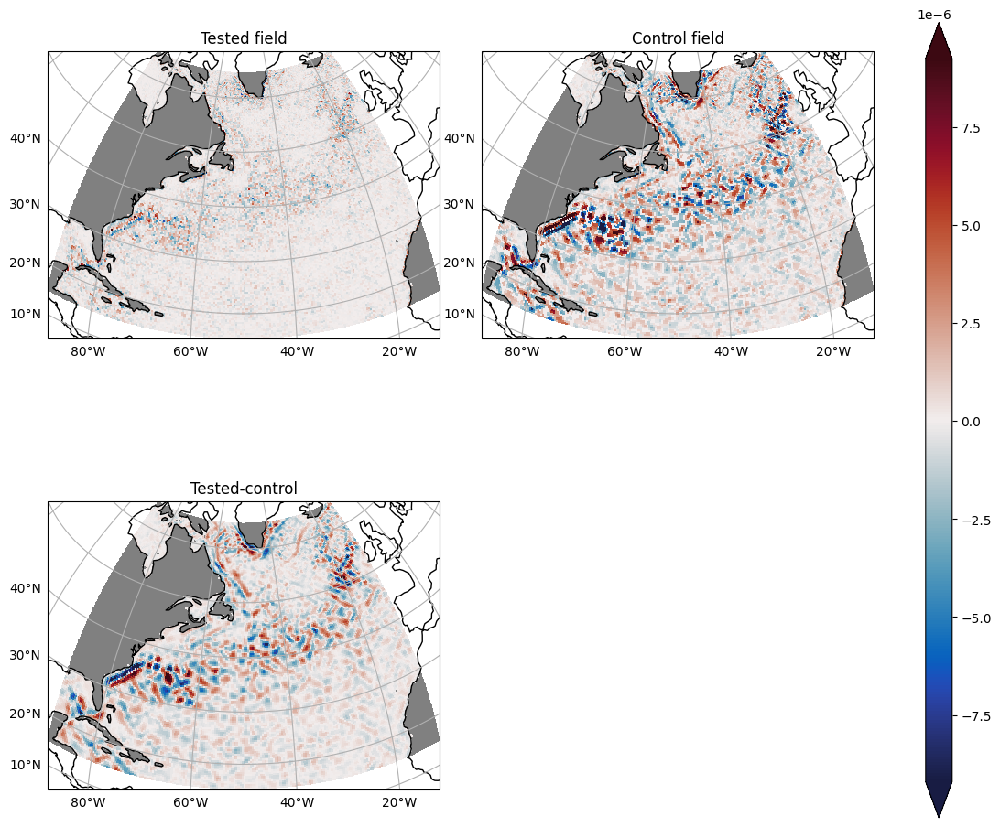

In [199]:
compare(ds2d.nanvar(dTxx_du+dTxy_du_interp),ds2d.nanvar(dTxx_du))

Correlation: 0.7431601575743496
Relative Error: 0.7733313699166224
R2 =  0.44538557637281573
R2 max =  0.5521971907123508
Optinal scaling: 1.785099082571271
Nans [test/control]: [7733, 7733]


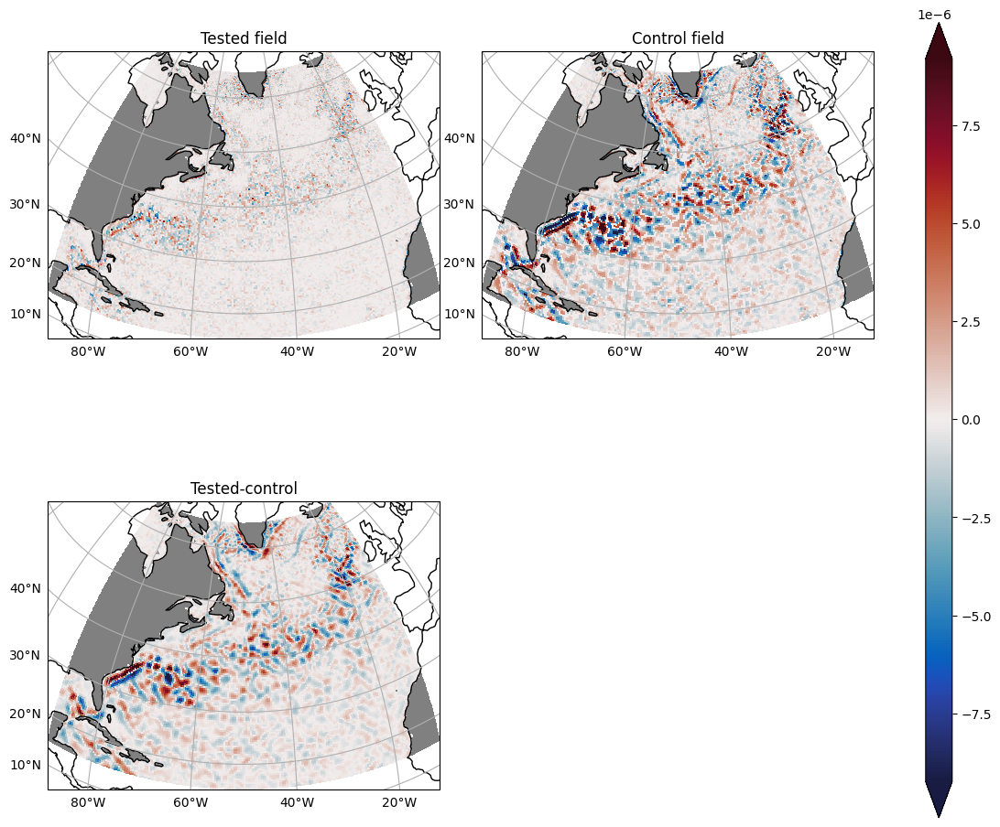

In [200]:
compare(ds2d.nanvar(dTyy_dv+dTxy_dv_interp),ds2d.nanvar(dTyy_dv))

So, seems that trace for ZB model is zero

# Rotation invariances

In [6]:
from helpers.ann_tools import import_ANN

In [205]:
#ann_Txy = import_ANN('/scratch/pp2681/mom6/CM26_ML_models/ocean3d/subfilter/FGR3/EXP-32-32/staggered/model/Txy.nc')
#ann_Txx_Tyy = import_ANN('/scratch/pp2681/mom6/CM26_ML_models/ocean3d/subfilter/FGR3/EXP-32-32/staggered/model/Txx_Tyy.nc')
ann_Txy = None
ann_Txx_Tyy = None
def predict(key, **kw):
    return ds2d.state.ANN(ann_Txy,ann_Txx_Tyy,jacobian_trace=True, **kw)[key]

Correlation: 0.999941619504156
Relative Error: 0.0008059856993578297
R2 =  0.9998831507929887
R2 max =  0.9998832048111042
Optinal scaling: 0.9997676224624726
Nans [test/control]: [0, 0]
Correlation: 0.9999242081263269
Relative Error: 0.0007126473076746716
R2 =  0.9998485674006637
R2 max =  0.9998485958793583
Optinal scaling: 0.999831259384649
Nans [test/control]: [0, 0]
Correlation: 0.9994835992734772
Relative Error: 0.005082368344207178
R2 =  0.9989683789143209
R2 max =  0.9989686003872295
Optinal scaling: 0.9995293696337668
Nans [test/control]: [0, 0]


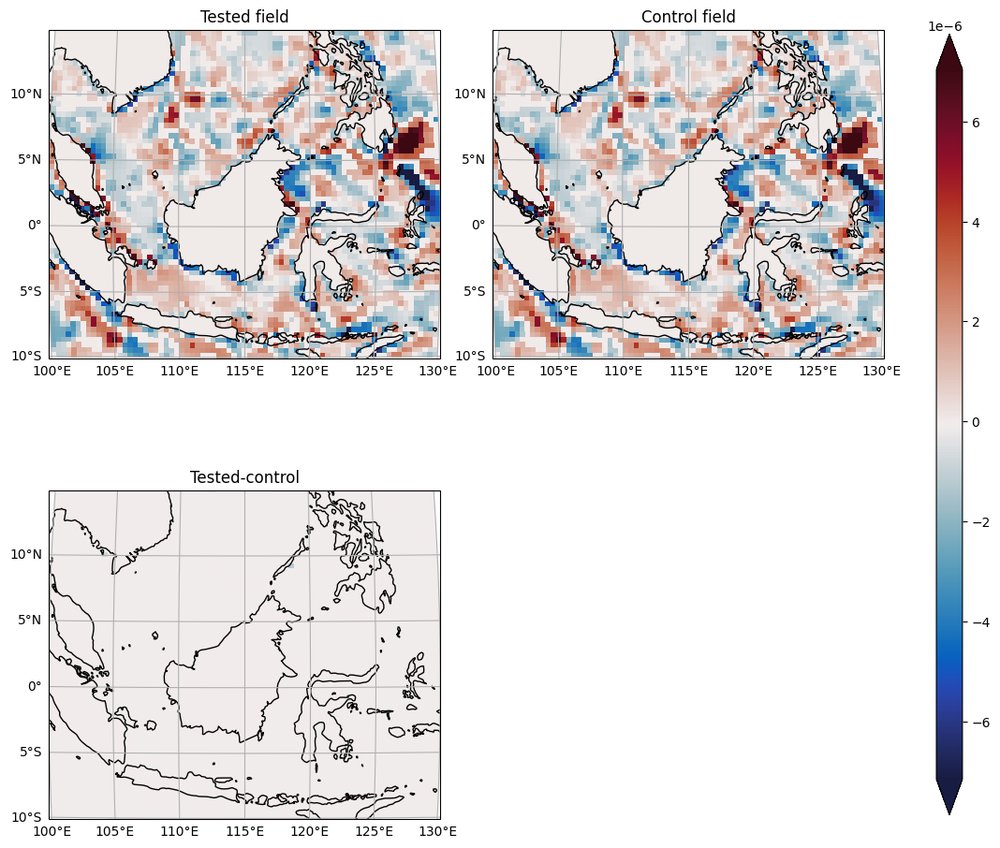

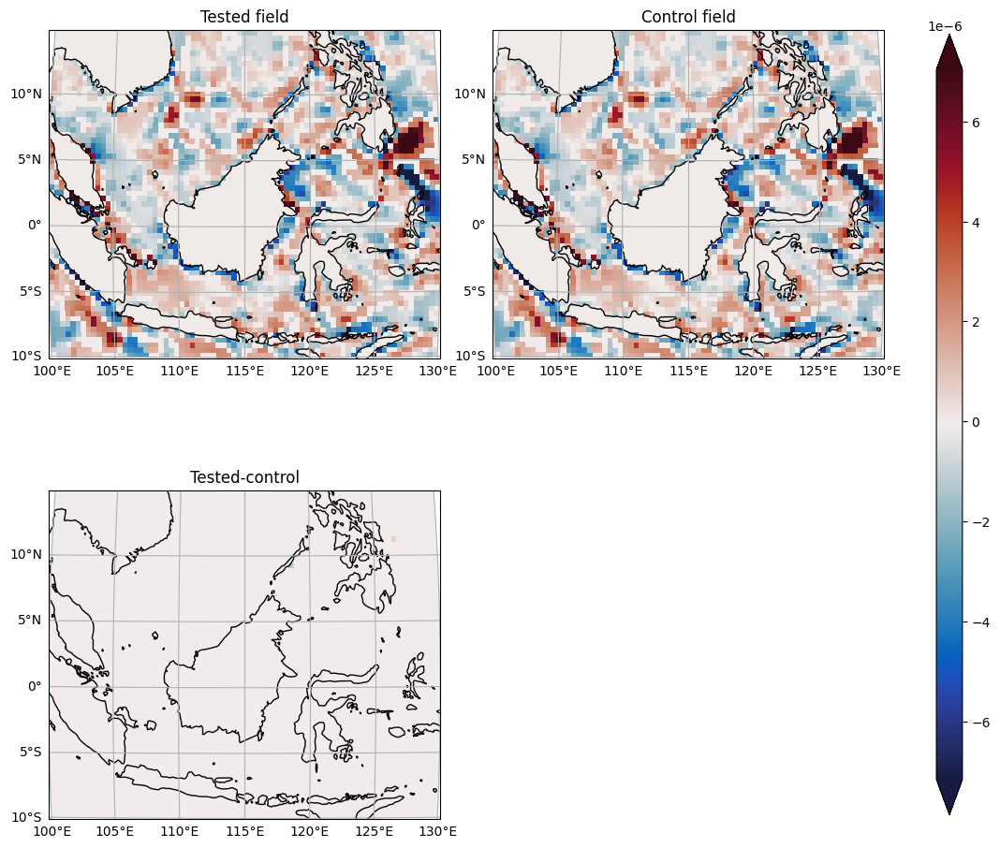

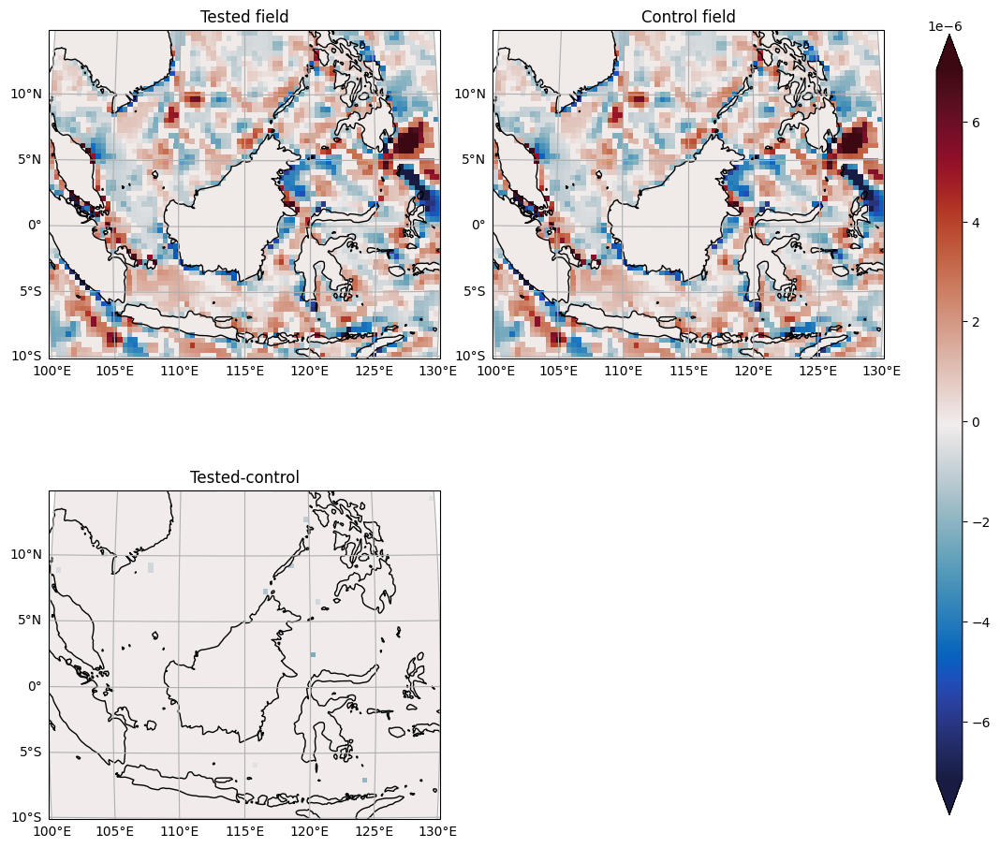

In [206]:
compare(predict('dTxx_du', reflect_x=True), predict('dTxx_du'), selector=select_Cem)
compare(predict('dTxx_du', reflect_y=True), predict('dTxx_du'), selector=select_Cem)
compare(predict('dTxx_du', rotation=90), predict('dTxx_du'), selector=select_Cem)

Correlation: 0.9999413844388972
Relative Error: 0.0005569256264706526
R2 =  0.9998827938669818
R2 max =  0.999882878663241
Optinal scaling: 0.9997088697545752
Nans [test/control]: [0, 0]
Correlation: 0.9999241819137964
Relative Error: 0.0007578759832740944
R2 =  0.9998485223714348
R2 max =  0.9998485395724963
Optinal scaling: 0.9998688544509988
Nans [test/control]: [0, 0]
Correlation: 0.9994829781006698
Relative Error: 0.005136919051265737
R2 =  0.9989665534178306
R2 max =  0.9989673383373423
Optinal scaling: 0.9991143703996347
Nans [test/control]: [0, 0]


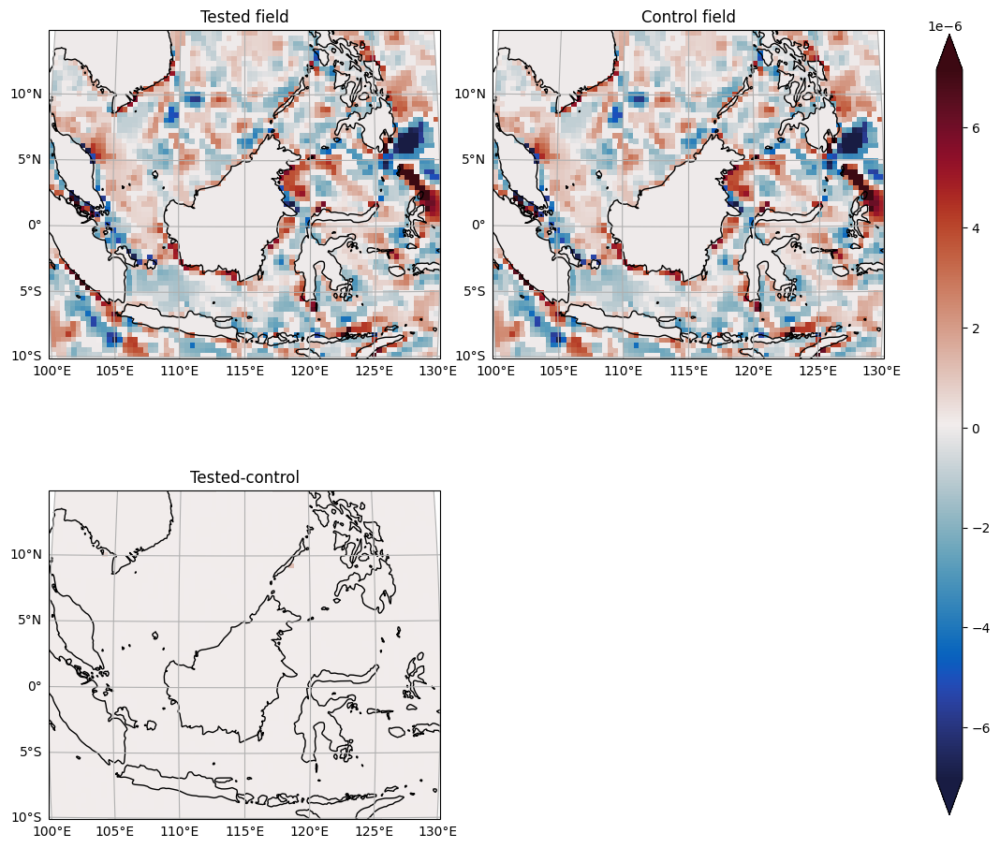

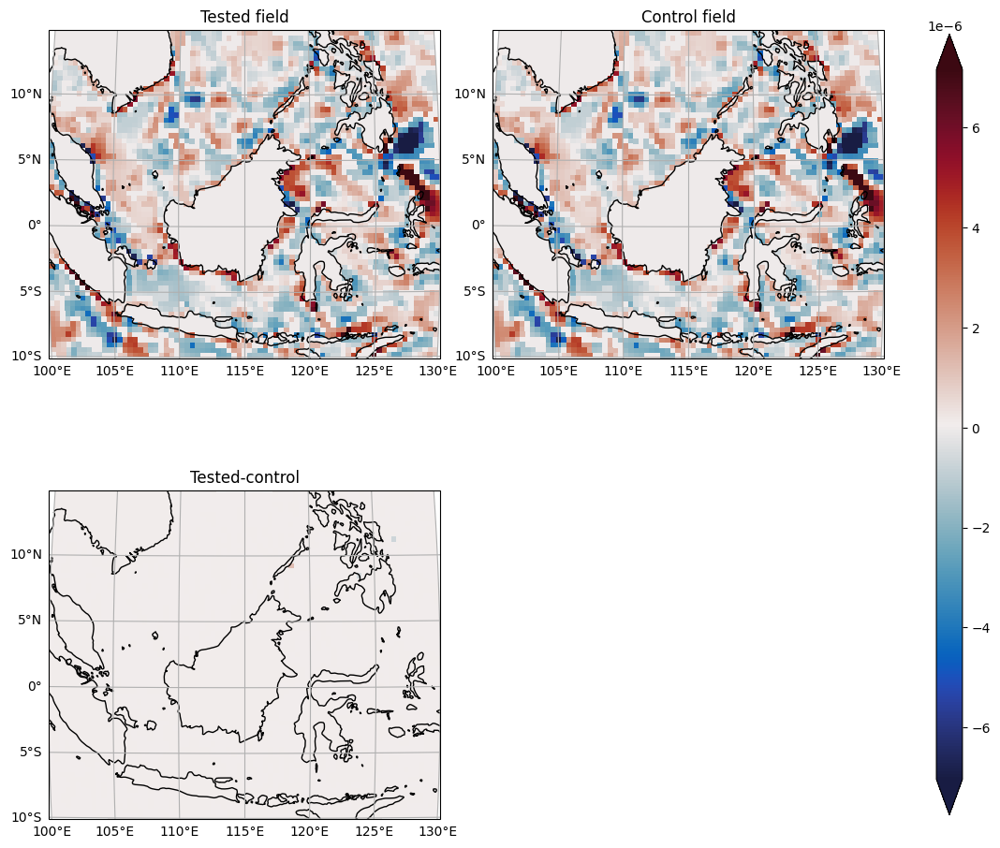

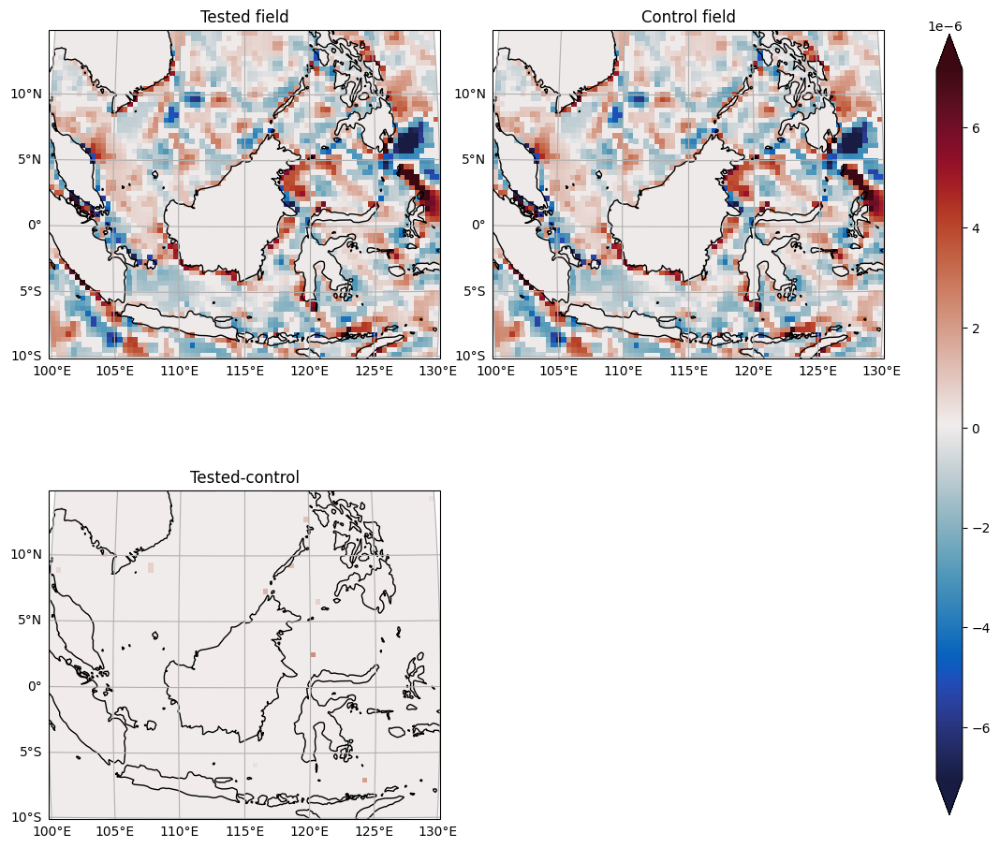

In [207]:
compare(predict('dTyy_dv', reflect_x=True), predict('dTyy_dv'), selector=select_Cem)
compare(predict('dTyy_dv', reflect_y=True), predict('dTyy_dv'), selector=select_Cem)
compare(predict('dTyy_dv', rotation=90), predict('dTyy_dv'), selector=select_Cem)

Correlation: 0.9446131149077769
Relative Error: 0.32934328971248805
R2 =  0.8879832736938257
R2 max =  0.8922704970643416
Optinal scaling: 0.9351763746603491
Nans [test/control]: [0, 0]
Correlation: 0.9446131068051933
Relative Error: 0.3292794973219909
R2 =  0.8879841699554277
R2 max =  0.8922685536243098
Optinal scaling: 0.9351963891683422
Nans [test/control]: [0, 0]
Correlation: 0.9520571409580286
Relative Error: 0.3022254805844757
R2 =  0.9024610452861087
R2 max =  0.9063452614113153
Optinal scaling: 0.9385579162058468
Nans [test/control]: [0, 0]


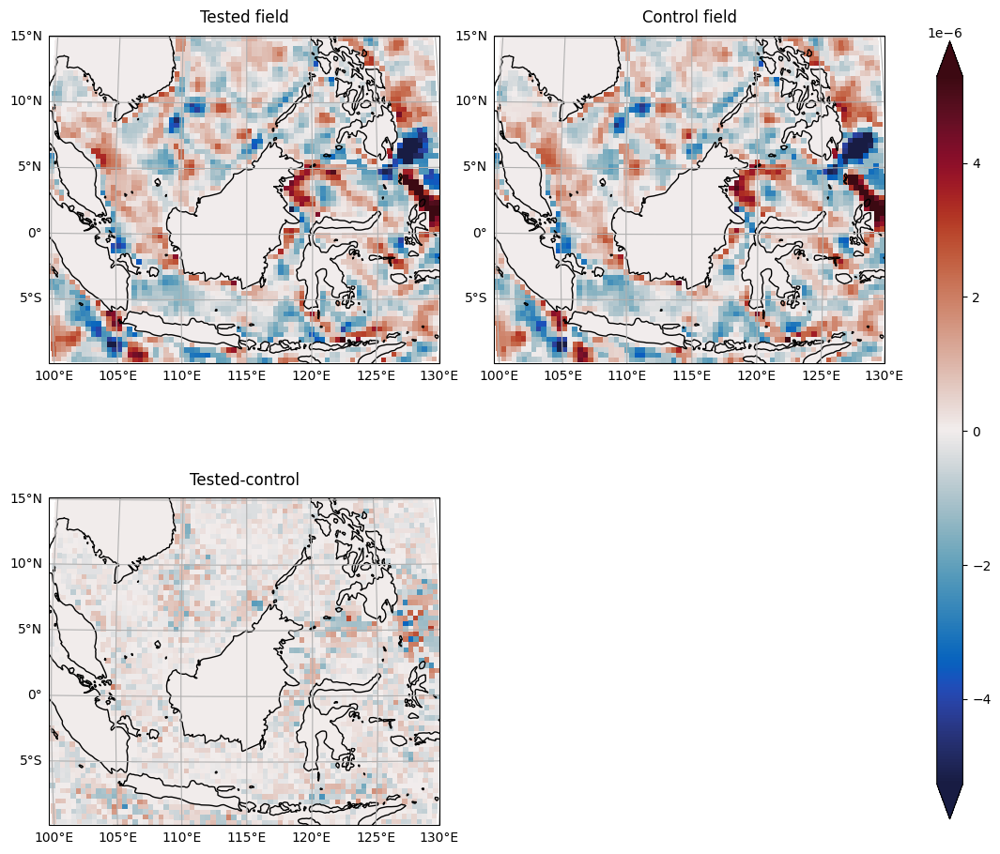

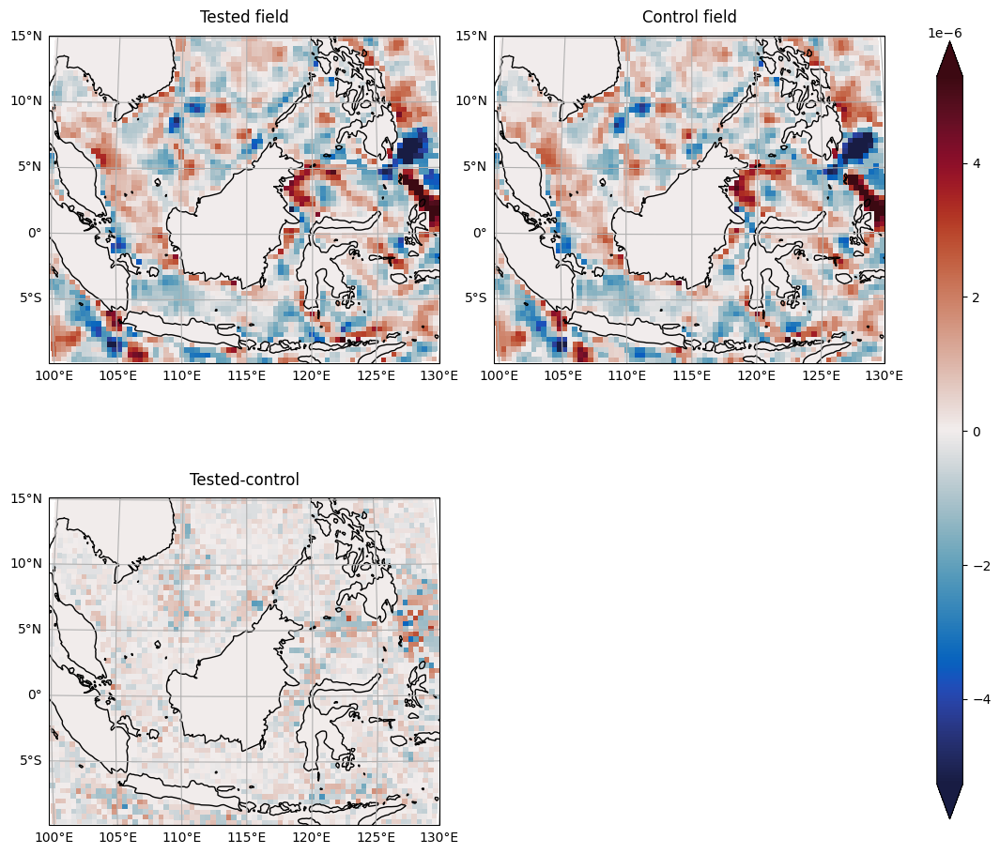

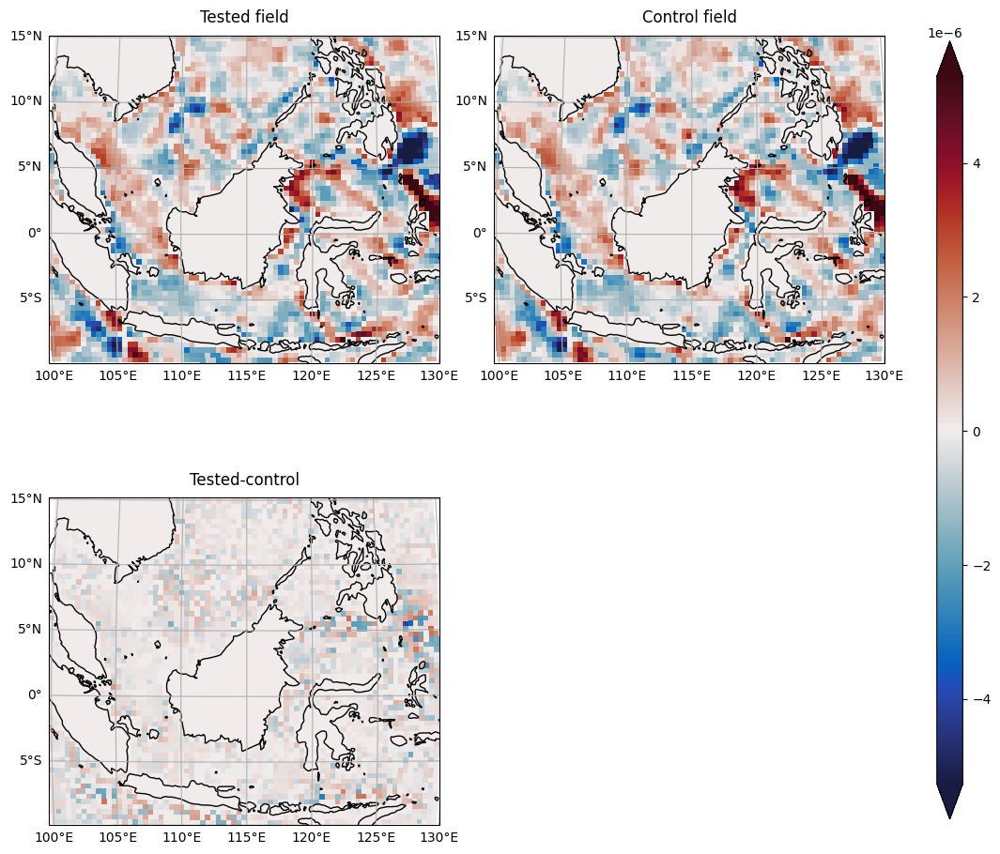

In [208]:
compare(predict('dTxy_du', reflect_x=True), predict('dTxy_du'), selector=select_Cem)
compare(predict('dTxy_du', reflect_y=True), predict('dTxy_du'), selector=select_Cem)
compare(predict('dTxy_du', rotation=90), predict('dTxy_du'), selector=select_Cem)

Correlation: 0.9446190491117579
Relative Error: 0.32935257887970454
R2 =  0.8879900719494244
R2 max =  0.8922809198648047
Optinal scaling: 0.9351511093596022
Nans [test/control]: [0, 0]
Correlation: 0.9446229786623929
Relative Error: 0.3292536150022455
R2 =  0.8880070725206675
R2 max =  0.8922874451694348
Optinal scaling: 0.9352254066106442
Nans [test/control]: [0, 0]
Correlation: 0.9520595858156965
Relative Error: 0.30225236531342886
R2 =  0.9024587375126895
R2 max =  0.9063504290024716
Optinal scaling: 0.9385026192490146
Nans [test/control]: [0, 0]


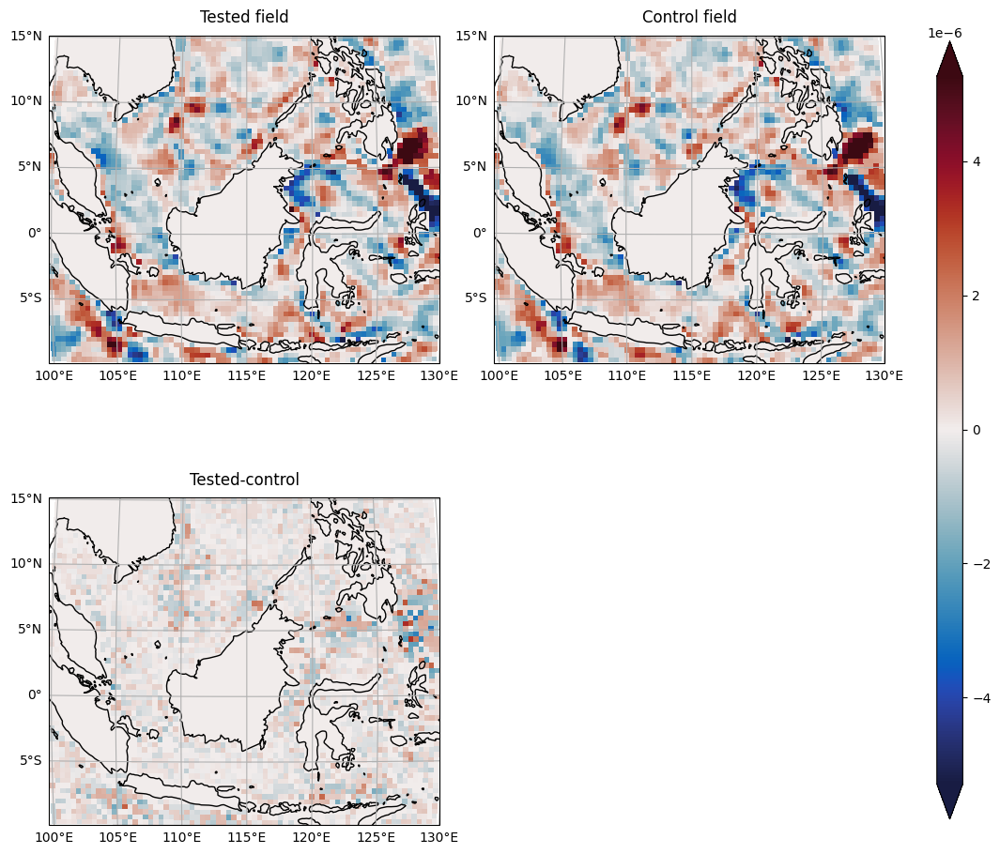

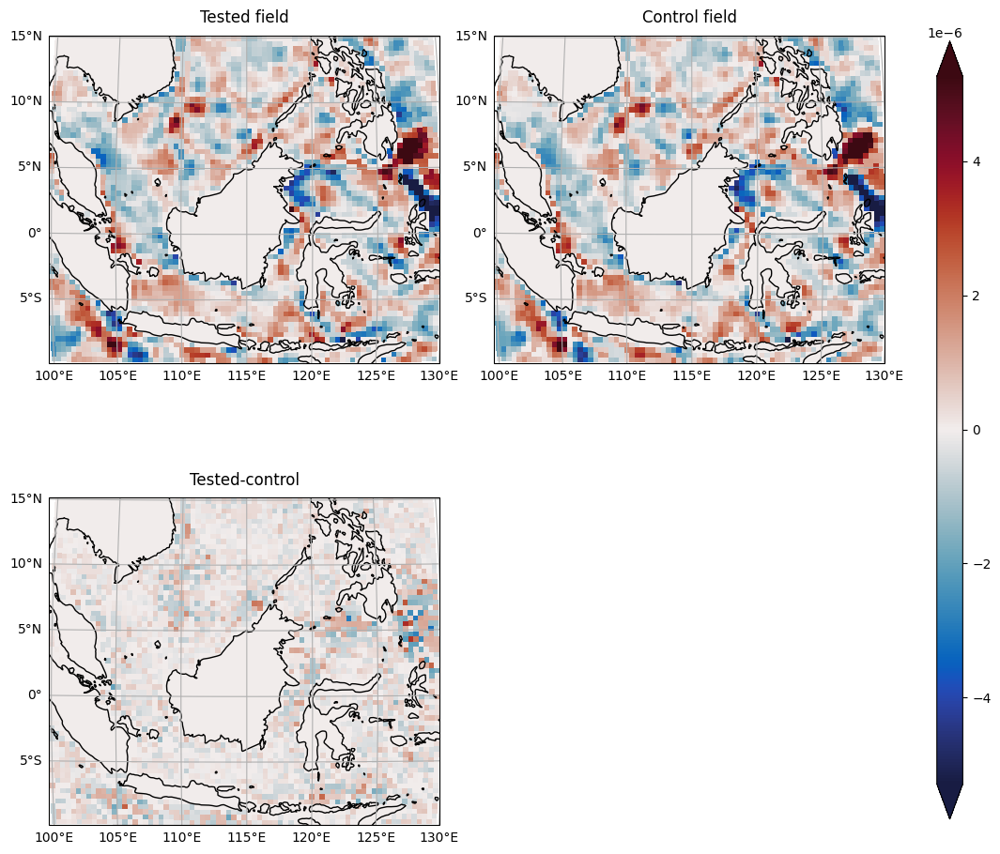

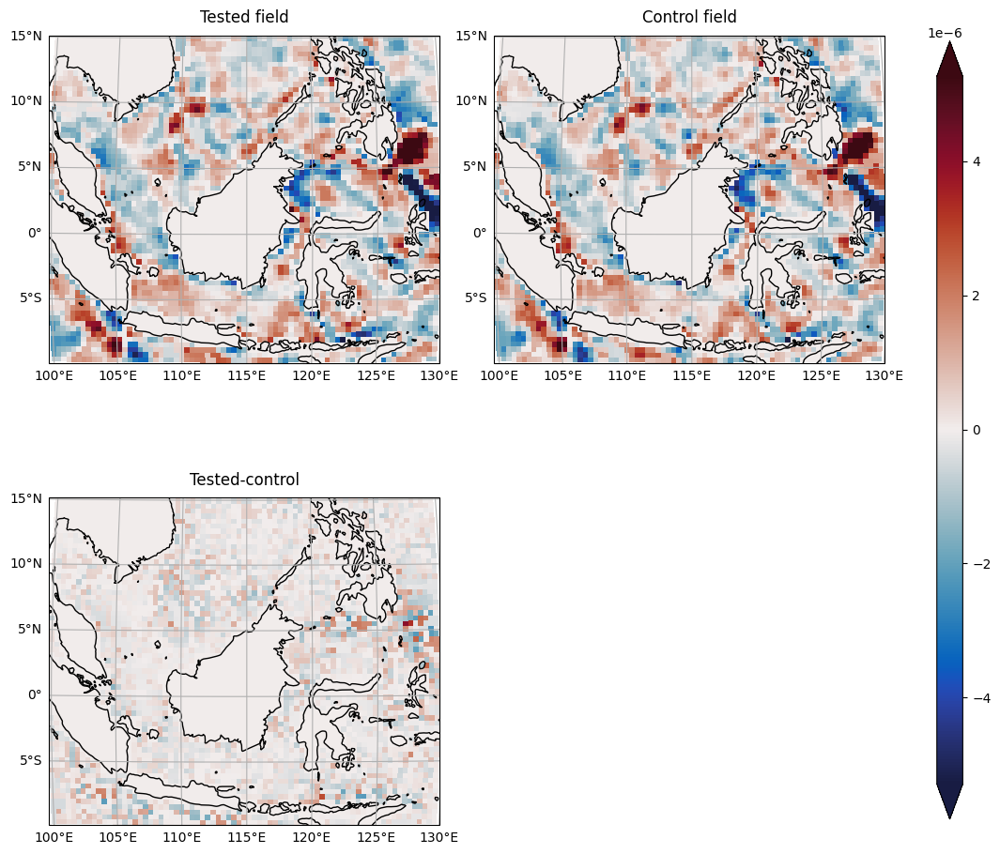

In [209]:
compare(predict('dTxy_dv', reflect_x=True), predict('dTxy_dv'), selector=select_Cem)
compare(predict('dTxy_dv', reflect_y=True), predict('dTxy_dv'), selector=select_Cem)
compare(predict('dTxy_dv', rotation=90), predict('dTxy_dv'), selector=select_Cem)

# Check dissipative models

In [210]:
ann_Txy = import_ANN('/scratch/pp2681/mom6/CM26_ML_models/ocean3d/subgrid/FGR-1/EXP3/model/Txy.nc')
ann_Txx_Tyy = import_ANN('/scratch/pp2681/mom6/CM26_ML_models/ocean3d/subgrid/FGR-1/EXP3/model/Txx_Tyy.nc')

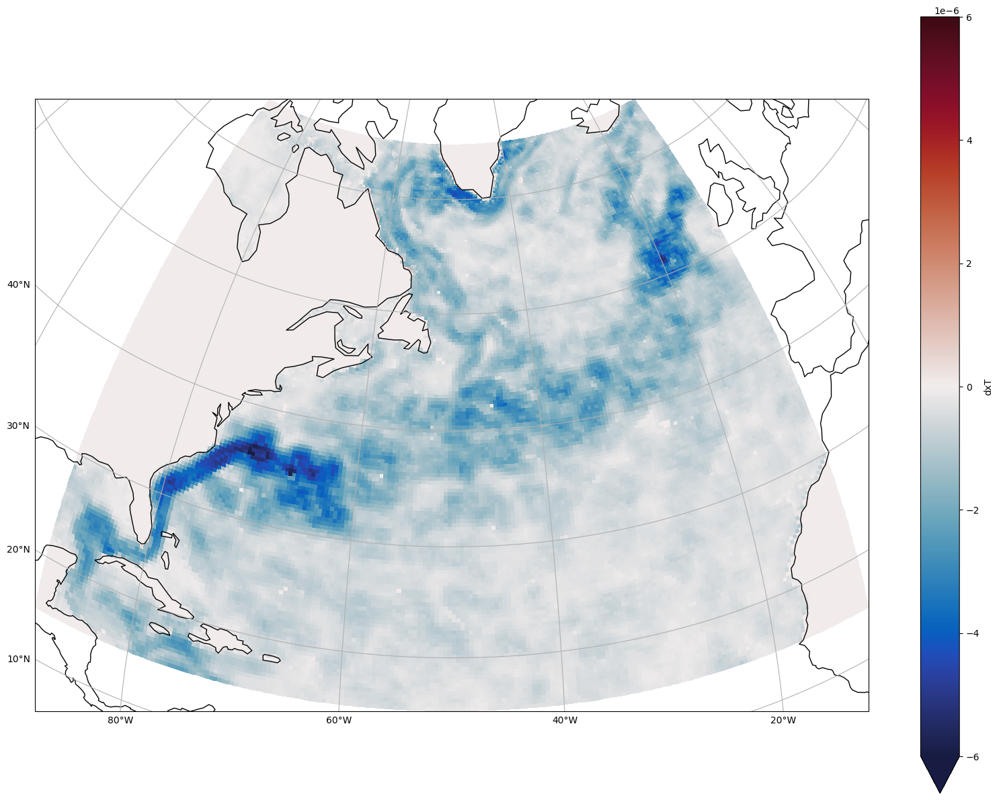

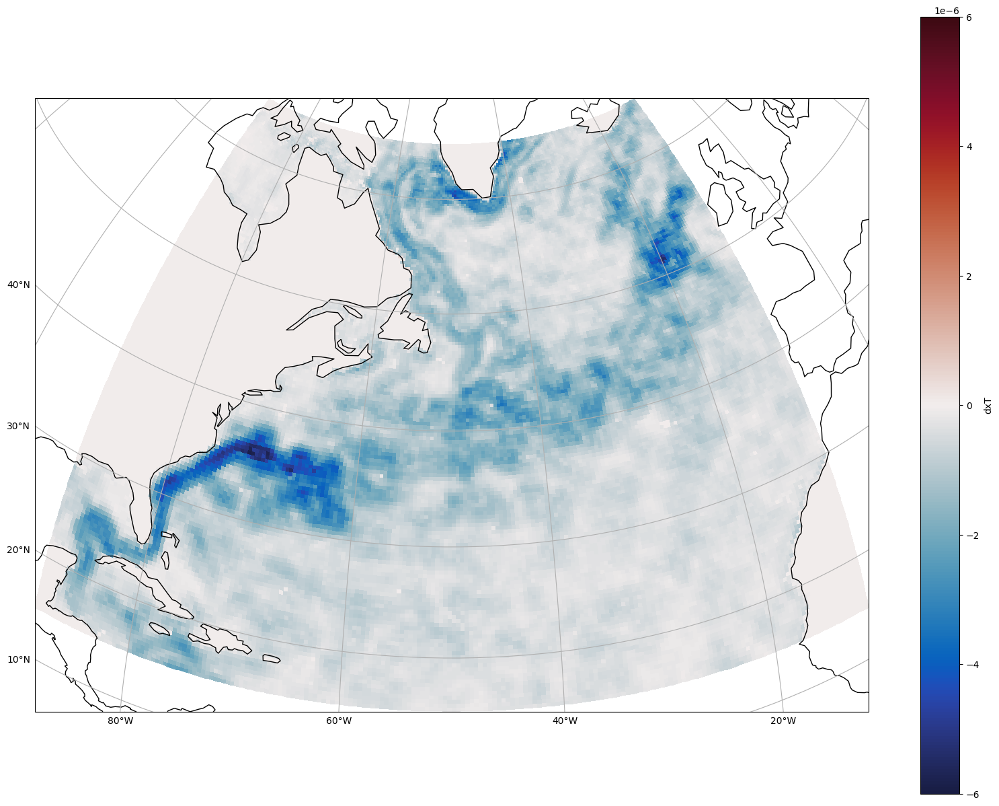

In [219]:
plot(ds2d.state.ANN(ann_Txy, ann_Txx_Tyy, jacobian_trace=True)['dTxx_du'], vmin=-6e-6, vmax=6e-6)
plot(ds2d.state.ANN(ann_Txy, ann_Txx_Tyy, jacobian_trace=True)['dTyy_dv'], vmin=-6e-6, vmax=6e-6)

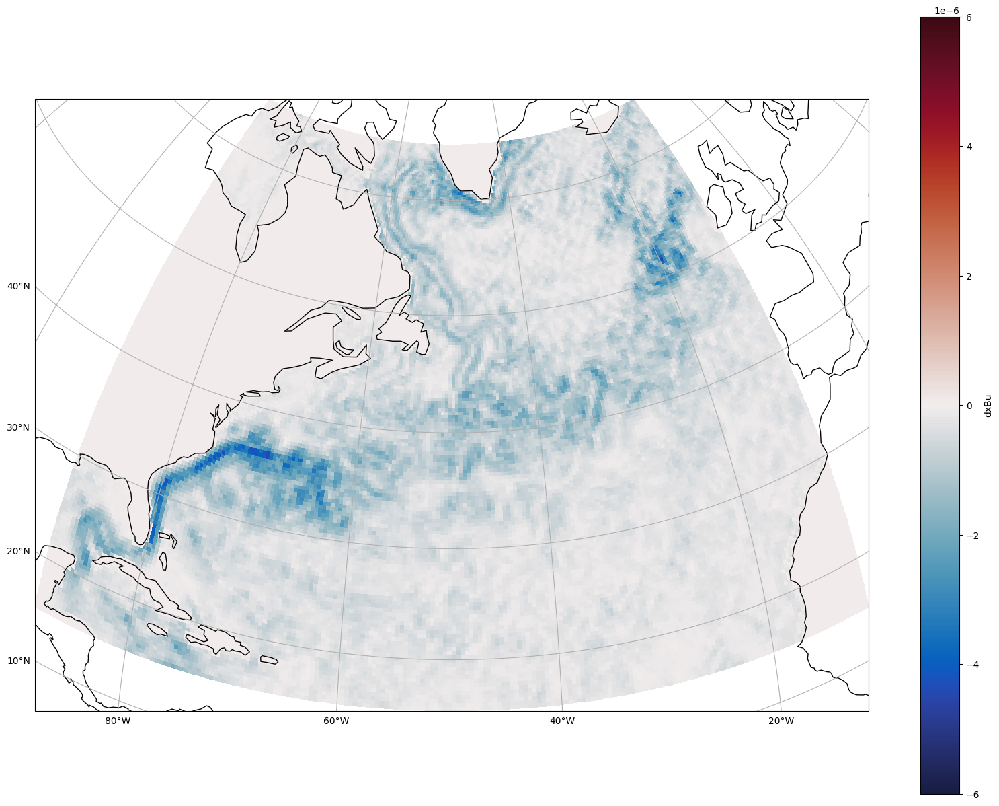

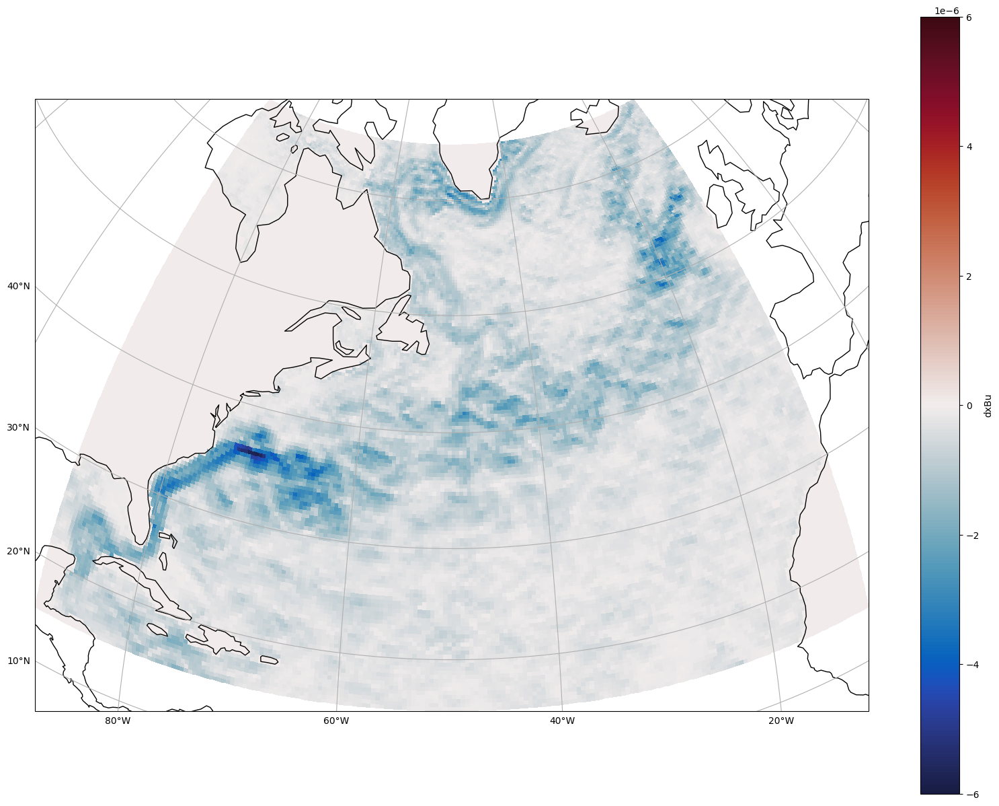

In [218]:
plot(ds2d.state.ANN(ann_Txy, ann_Txx_Tyy, jacobian_trace=True)['dTxy_du'], vmin=-6e-6, vmax=6e-6)
plot(ds2d.state.ANN(ann_Txy, ann_Txx_Tyy, jacobian_trace=True)['dTxy_dv'], vmin=-6e-6, vmax=6e-6)

In [220]:
ann_Txy = import_ANN('/scratch/pp2681/mom6/CM26_ML_models/ocean3d/subgrid/FGR-1/EXP1/model/Txy.nc')
ann_Txx_Tyy = import_ANN('/scratch/pp2681/mom6/CM26_ML_models/ocean3d/subgrid/FGR-1/EXP1/model/Txx_Tyy.nc')

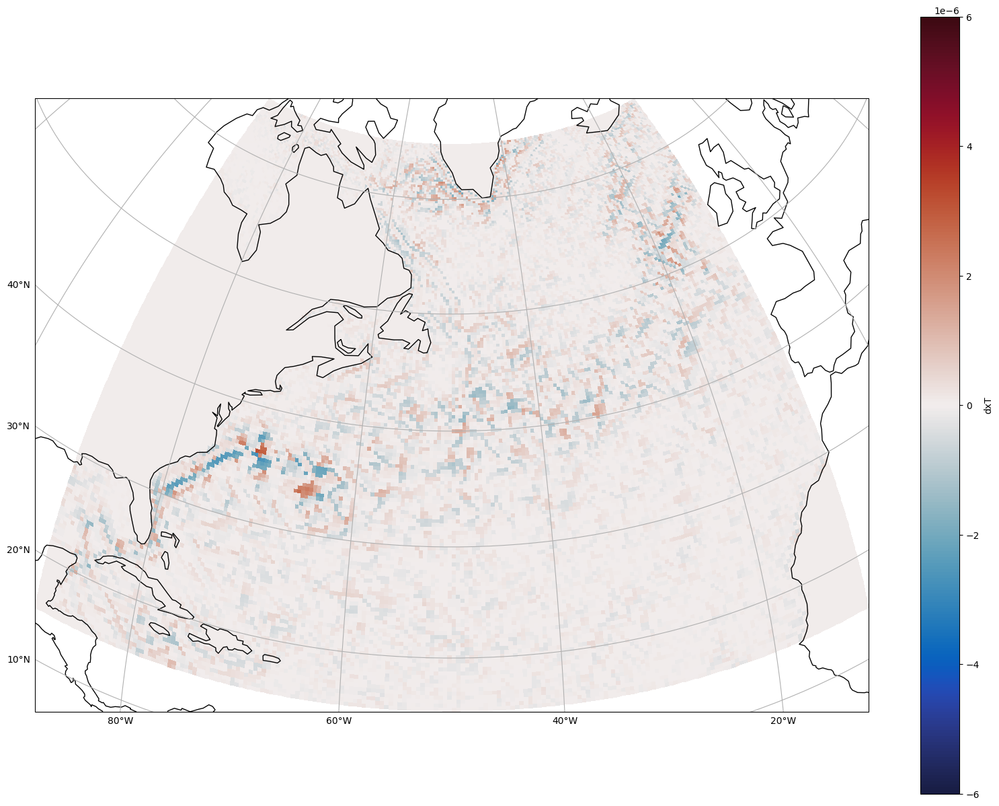

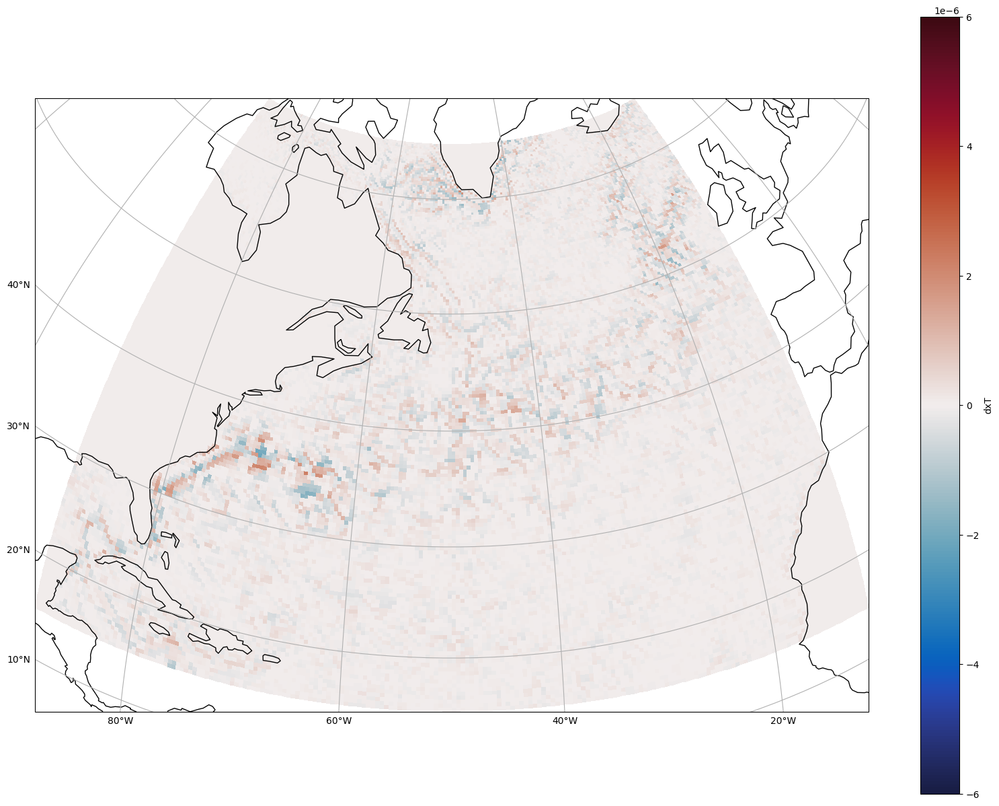

In [221]:
plot(ds2d.state.ANN(ann_Txy, ann_Txx_Tyy, jacobian_trace=True)['dTxx_du'], vmin=-6e-6, vmax=6e-6)
plot(ds2d.state.ANN(ann_Txy, ann_Txx_Tyy, jacobian_trace=True)['dTyy_dv'], vmin=-6e-6, vmax=6e-6)

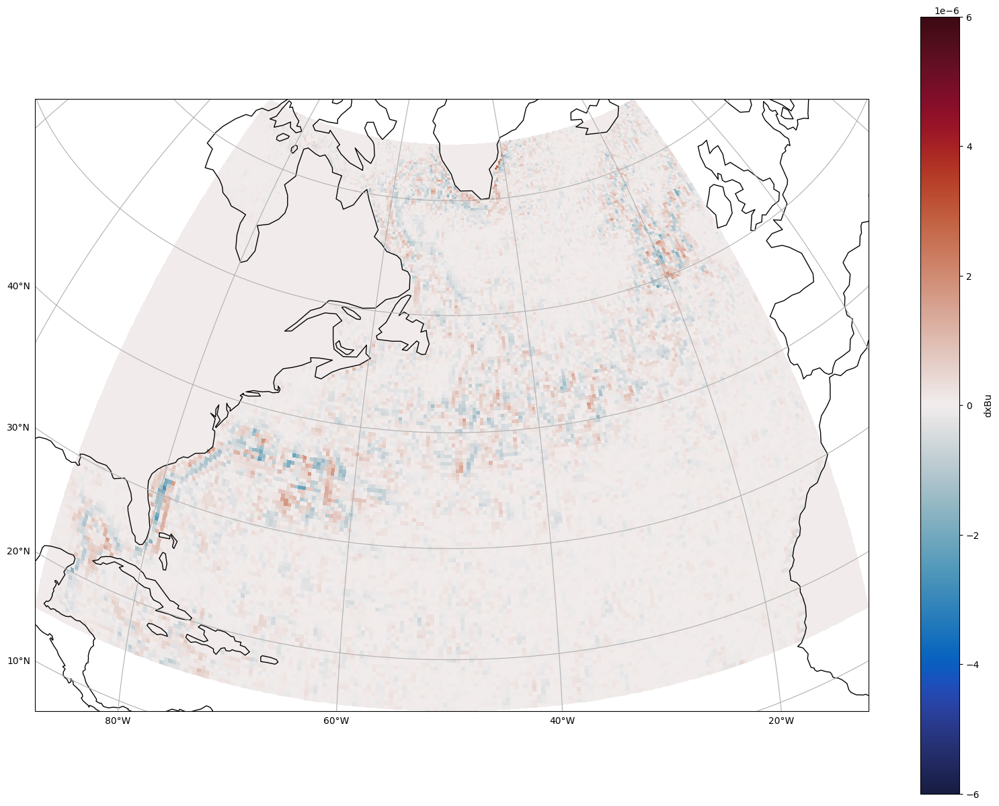

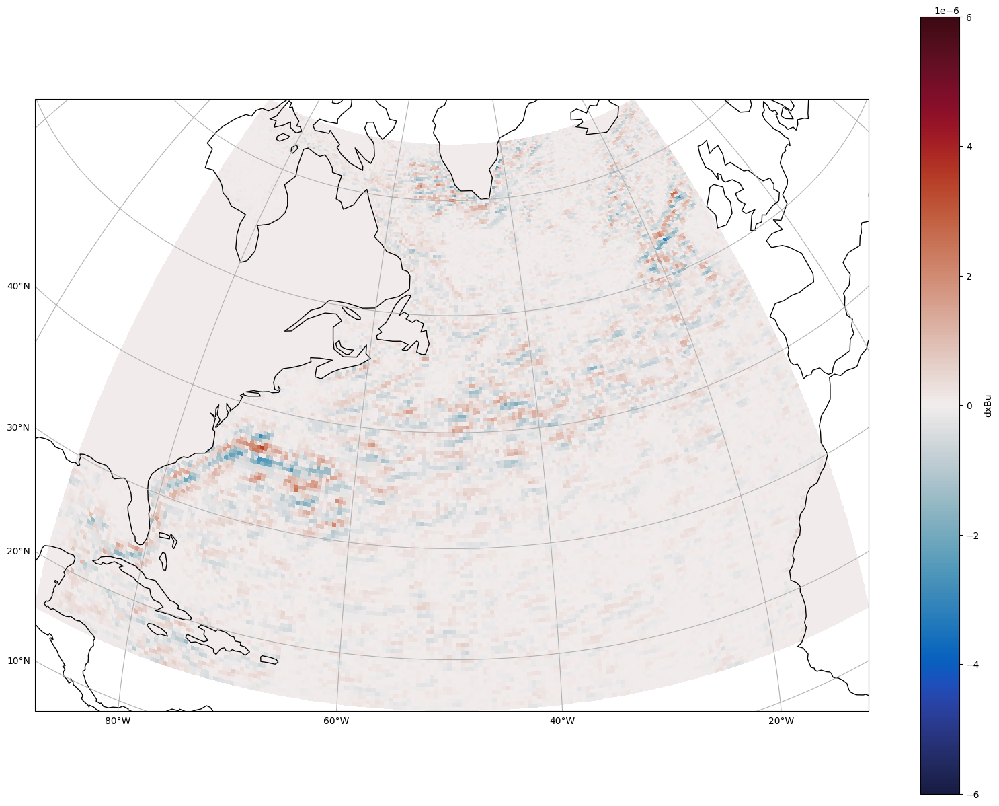

In [222]:
plot(ds2d.state.ANN(ann_Txy, ann_Txx_Tyy, jacobian_trace=True)['dTxy_du'], vmin=-6e-6, vmax=6e-6)
plot(ds2d.state.ANN(ann_Txy, ann_Txx_Tyy, jacobian_trace=True)['dTxy_dv'], vmin=-6e-6, vmax=6e-6)

In [223]:
# Indeed, short wave dissipation constraint results to negative trace

# Compare to Smagorinsky kernel

In [225]:
kernel =  - ds2d.state.Smagorinsky()['Shear_mag'] * 0.06 * 8.

ann_Txy = import_ANN('/scratch/pp2681/mom6/CM26_ML_models/ocean3d/subgrid/FGR-1/EXP3/model/Txy.nc')
ann_Txx_Tyy = import_ANN('/scratch/pp2681/mom6/CM26_ML_models/ocean3d/subgrid/FGR-1/EXP3/model/Txx_Tyy.nc')

Correlation: 0.8804052794213546
Relative Error: 0.3475088291929102
R2 =  0.7920472792324311
R2 max =  0.865870492577094
Optinal scaling: 0.7739989833359951
Nans [test/control]: [0, 0]


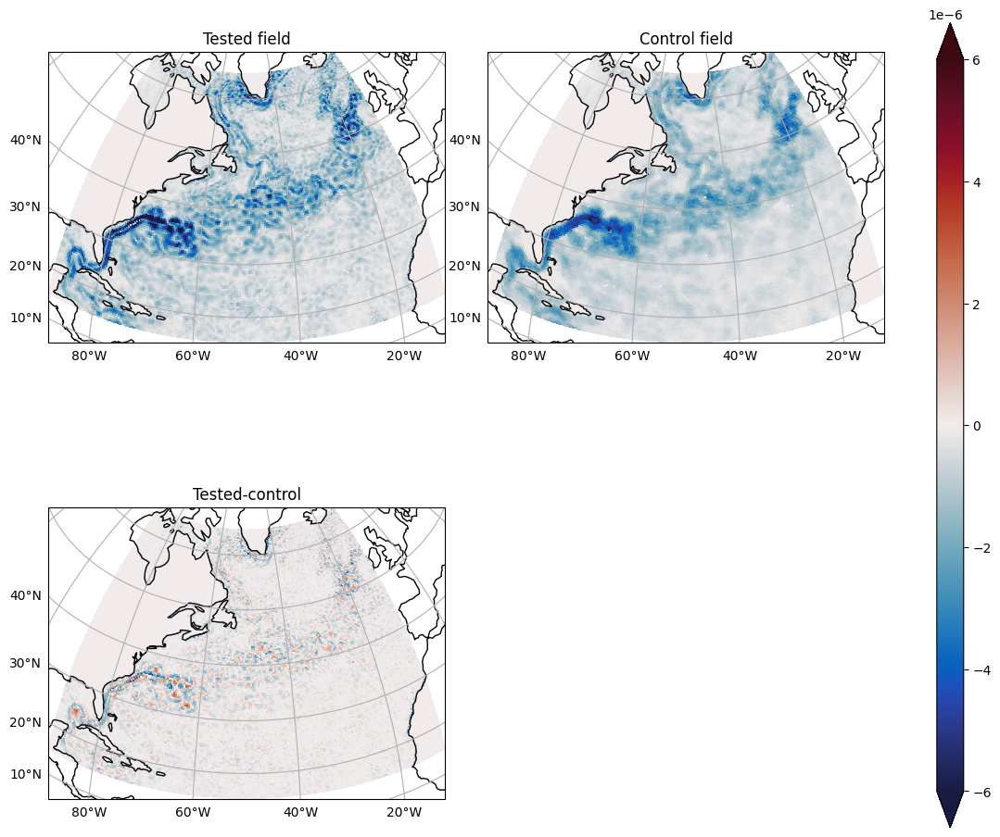

In [226]:
compare(kernel, ds2d.state.ANN(ann_Txy, ann_Txx_Tyy, jacobian_trace=True)['dTxx_du'], vmin=-6e-6, vmax=6e-6)

Correlation: 0.8869335712180474
Relative Error: 0.36970466437138566
R2 =  0.7739955333356048
R2 max =  0.8729023841427545
Optinal scaling: 0.7481599471987329
Nans [test/control]: [0, 0]


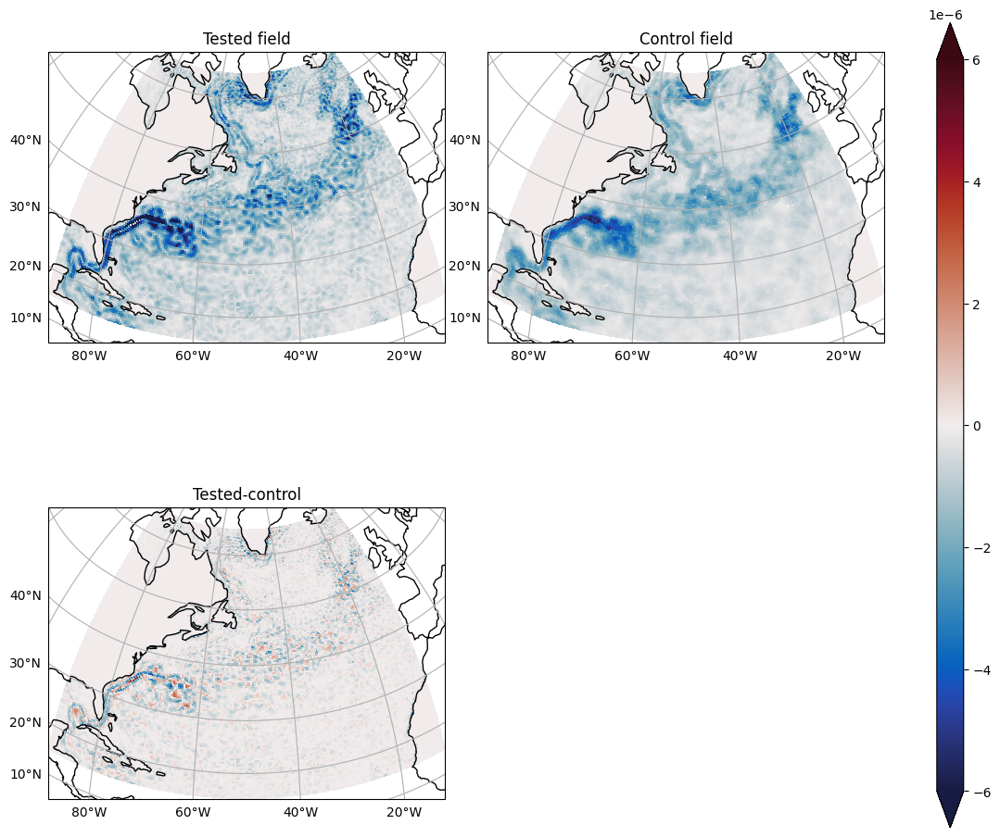

In [228]:
compare(kernel, ds2d.state.ANN(ann_Txy, ann_Txx_Tyy, jacobian_trace=True)['dTyy_dv'], vmin=-6e-6, vmax=6e-6)

In [232]:
%timeit ds2d.state.Apply_ANN()

465 ms ± 704 µs per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [233]:
%timeit ds2d.state.Apply_ANN(jacobian_trace=True)

762 ms ± 7.11 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


# Verifying directly of Smagorinsky model

In [4]:
kernel =  - ds2d.state.Smagorinsky()['Shear_mag'] * 0.06 * 8.

In [9]:
ann_Txy = import_ANN('/home/pp2681/MOM6-examples/src/MOM6/experiments/ANN-Results/trained_models/ANN_Txy_Smag.nc')
ann_Txx_Tyy = import_ANN('/home/pp2681/MOM6-examples/src/MOM6/experiments/ANN-Results/trained_models/ANN_Txx_Tyy_Smag.nc')

Correlation: 0.9989798994490026
Relative Error: 0.05732616055737009
R2 =  0.9974216705031635
R2 max =  0.9979607728014922
Optinal scaling: 0.9772856466906642
Nans [test/control]: [0, 0]


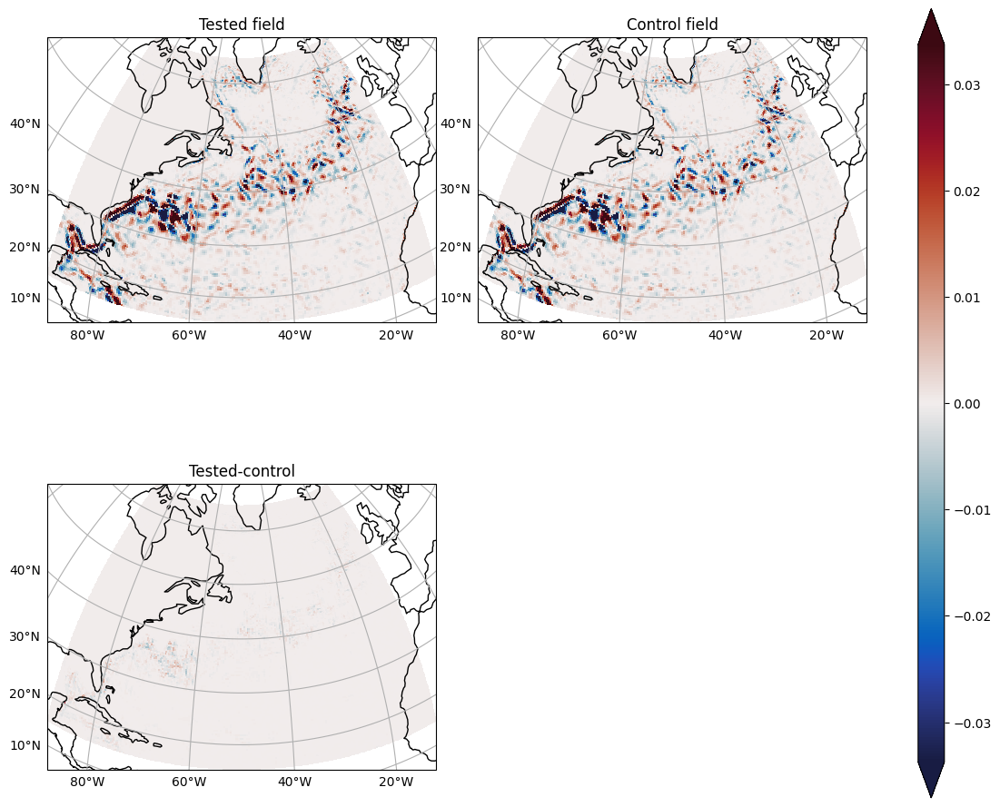

In [14]:
compare(ds2d.state.Smagorinsky()['Txx'], ds2d.state.ANN(ann_Txy, ann_Txx_Tyy)['Txx'])

Correlation: 0.9989799166227444
Relative Error: 0.05732745390569416
R2 =  0.9974215722182236
R2 max =  0.997960807004666
Optinal scaling: 0.9772829195398145
Nans [test/control]: [0, 0]


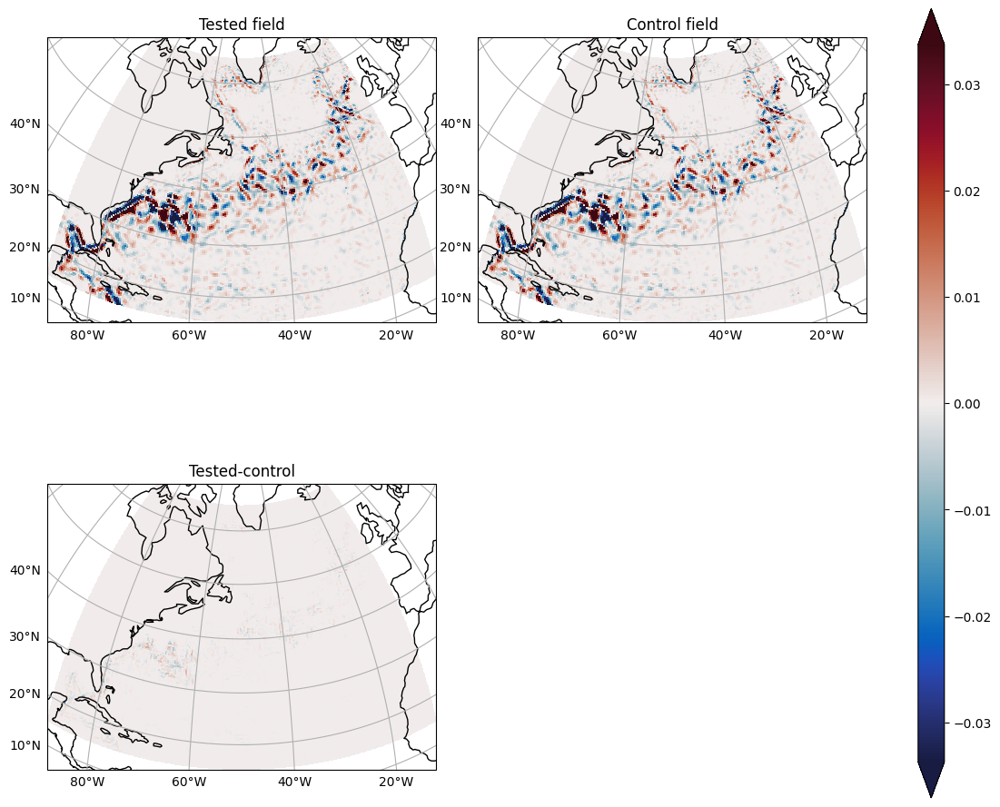

In [15]:
compare(ds2d.state.Smagorinsky()['Tyy'], ds2d.state.ANN(ann_Txy, ann_Txx_Tyy)['Tyy'])

Correlation: 0.9915354100519395
Relative Error: 0.13296734216536324
R2 =  0.9758722506618681
R2 max =  0.9831428267121965
Optinal scaling: 1.0940866065358716
Nans [test/control]: [0, 0]


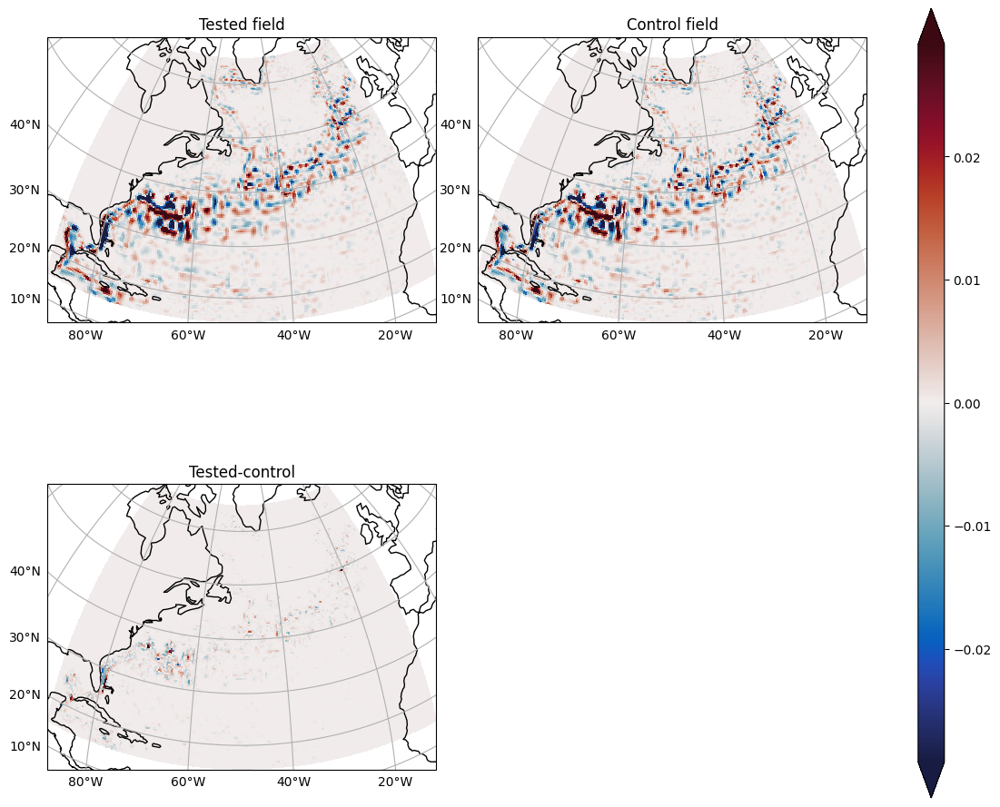

In [16]:
compare(ds2d.state.Smagorinsky()['Txy'], ds2d.state.ANN(ann_Txy, ann_Txx_Tyy)['Txy'])

Correlation: 0.9880148984836591
Relative Error: 0.14645560113308348
R2 =  0.9756053286282328
R2 max =  0.9761734718505689
Optinal scaling: 1.0247212925991083
Nans [test/control]: [0, 0]


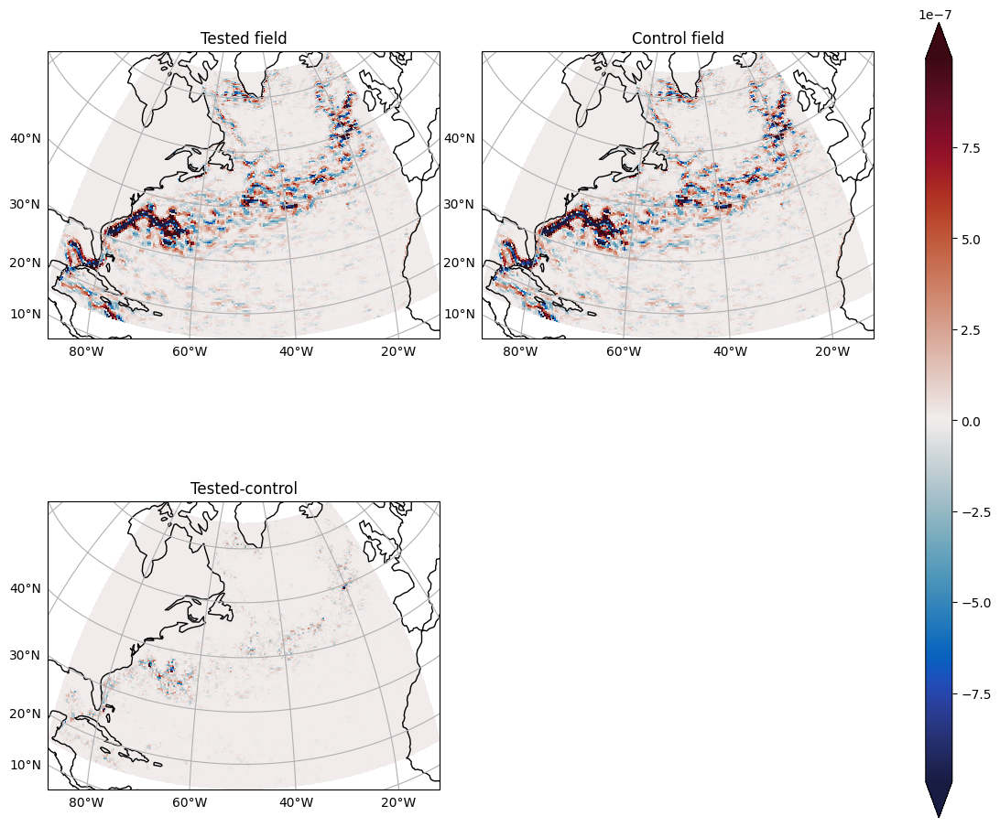

In [20]:
compare(ds2d.state.Smagorinsky()['smagx'], ds2d.state.ANN(ann_Txy, ann_Txx_Tyy)['ZB20u'])

Correlation: 0.985274060328819
Relative Error: 0.14970436565034564
R2 =  0.9695365644686775
R2 max =  0.9707649691334563
Optinal scaling: 1.0368845142893544
Nans [test/control]: [0, 0]


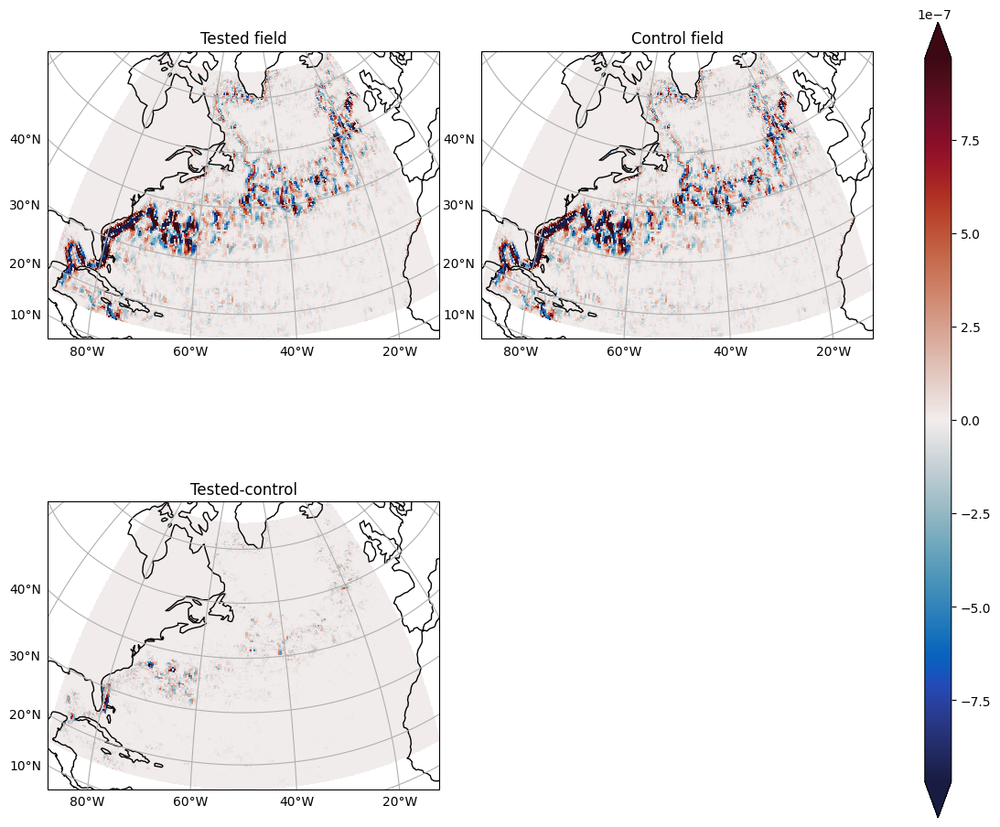

In [21]:
compare(ds2d.state.Smagorinsky()['smagy'], ds2d.state.ANN(ann_Txy, ann_Txx_Tyy)['ZB20v'])

Correlation: 0.9360592847088409
Relative Error: 0.3804279638034146
R2 =  0.8100760247446757
R2 max =  0.917823268835896
Optinal scaling: 1.5212099737401232
Nans [test/control]: [0, 0]


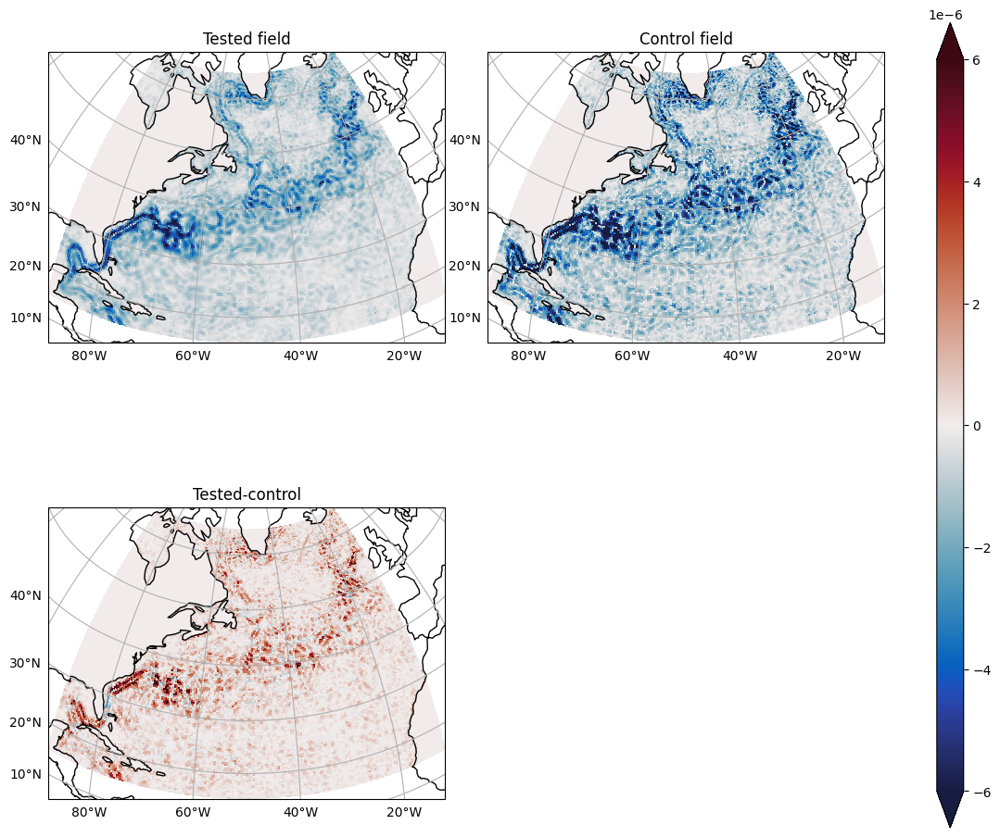

In [19]:
compare(kernel, ds2d.state.ANN(ann_Txy, ann_Txx_Tyy, jacobian_trace=True)['dTyy_dv'], vmin=-6e-6, vmax=6e-6)

# So, our estimation of trace as Smagorinsky coefficient is rather an approximation